In [3]:
import torch
print(torch.__version__)  # Should show 2.4.1+cu121

2.4.0+cu118


In [4]:
import os
os.environ['R_LIBS_USER'] = '/data4/hussin/R/library'


In [5]:
from rpy2.robjects.vectors import StrVector
import rpy2.robjects.packages as rpackages
import rpy2.robjects as robjects

lib_path = "/data4/hussin/R/library"
robjects.r(f'.libPaths("{lib_path}")')



In [6]:
rpackages.isinstalled('mclust')


True

In [7]:
import os
import rpy2.robjects as robjects
from rpy2.robjects.vectors import StrVector
import rpy2.robjects.packages as rpackages

# Set R environment
os.environ['R_HOME'] = '/usr/lib/R'
os.environ['R_LIBS_USER'] = '/data4/hussin/R/library'

lib_path = os.environ['R_LIBS_USER']
robjects.r(f'.libPaths("{lib_path}")')

# Check + install only if needed
if not rpackages.isinstalled('mclust'):
    print("Installing mclust...")
    utils = rpackages.importr('utils')
    utils.install_packages(StrVector(['mclust']), repos='https://mirrors.tuna.tsinghua.edu.cn/CRAN/', lib=lib_path)
else:
    print("✓ mclust already installed")

# Now import it
mclust = rpackages.importr('mclust')
print("✓ Loaded mclust successfully")



R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



✓ mclust already installed
✓ Loaded mclust successfully


In [9]:
import torch
print(f"PyTorch: {torch.__version__}")
print(f"CUDA: {torch.version.cuda}")
print(f"GPU Available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"Memory: {torch.cuda.get_device_properties(0).total_memory/1e9:.1f}GB")
else:
    print("\n⚠️ Troubleshooting Steps:")
    print("1. Run 'nvidia-smi' to verify GPU detection")
    print("2. Check 'nvcc --version' matches 12.2")
    print("3. Ensure no other processes are using GPU (kill -9 PID)")

PyTorch: 2.4.0+cu118
CUDA: 11.8
GPU Available: True
GPU: NVIDIA H800 PCIe
Memory: 84.9GB


In [10]:
from skmisc.loess import loess

In [11]:
import os
import scanpy as sc
import pandas as pd
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
import numpy as np
#from skmisc.loess import loess
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import os
import sys
import cv2
import squidpy as sq
from MLN2SVG import MLN2SVG 
from config import *
from utils import *
import utils


In [ ]:
ls /data4/hussin/hussain/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1

filtered_feature_bc_matrix.h5  results/  spatial/


In [ ]:
input_dir = os.path.join('/data4/hussin/hussain/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1')
myadata = sc.read_visium(path=input_dir, count_file='filtered_feature_bc_matrix.h5')
myadata.var_names_make_unique()
img=cv2.imread(input_dir + "/spatial/tissue_hires_image.png")
myadata.uns['image']=img
myadata

/data4/hussin/hussain/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/data4/hussin/hussain/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 3798 × 36601
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial', 'image'
    obsm: 'spatial'

In [16]:
myadata

AnnData object with n_obs × n_vars = 3798 × 36601
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial', 'image'
    obsm: 'spatial'

In [ ]:
Ann_df = pd.read_csv(os.path.join('/data4/hussin/hussain/data/BRCA1/', 'metadata.tsv'), sep='\t', header=0, index_col=0)
Ann_df

,annot_type,fine_annot_type
ID,,
AAACAAGTATCTCCCA-1,Surrounding tumor,Tumor_edge_5
AAACACCAATAACTGC-1,Invasive,IDC_4
AAACAGAGCGACTCCT-1,Healthy,Healthy_1
AAACAGGGTCTATATT-1,Invasive,IDC_3
AAACAGTGTTCCTGGG-1,Invasive,IDC_4
...,...,...
TTGTTGTGTGTCAAGA-1,Invasive,IDC_7
TTGTTTCACATCCAGG-1,Invasive,IDC_4
TTGTTTCATTAGTCTA-1,Invasive,IDC_4


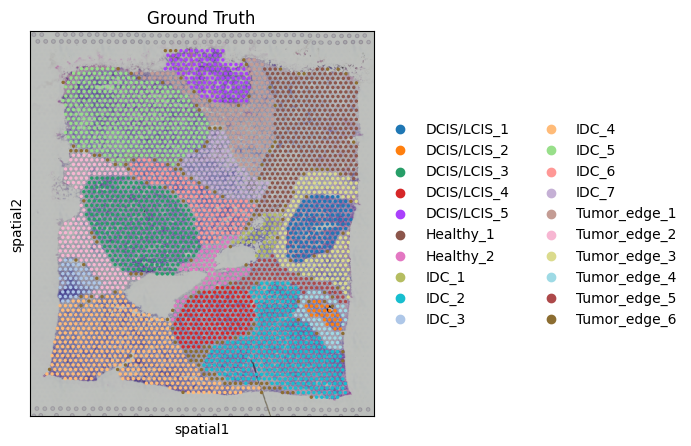

In [18]:
myadata.obs['Ground Truth'] = Ann_df.loc[myadata.obs_names, 'fine_annot_type']  # or 'fine_annot_type'

plt.rcParams["figure.figsize"] = (5, 5)
sc.pl.spatial(myadata, img_key="hires", color=["Ground Truth"])

In [19]:
from skmisc.loess import loess

In [20]:
sc.pp.highly_variable_genes(myadata, n_top_genes=3000, flavor='seurat_v3')

In [21]:

mln = MLN2SVG(myadata, num_cluster=20, n_epochs=35000, alpha=0.1,lr=1e-4)

In [22]:
adata_processed, exp_matrix_original, exp_matrix_augmented, graph = mln.load_data()

Stage 1: Spatial data reconstruction in progress...
Spatial graph assembled—ready for the next step!


In [23]:

latent_original, latent_aug, _, _ = mln.train_MLN2SVG(exp_matrix_original, exp_matrix_augmented, graph)

Phase 2: MLN2SVG Models training has benn started...


Training Loss: 17.5018: 100%|██████████| 35000/35000 [00:59<00:00, 585.26it/s]

✓ Model training completed successfully


In [24]:

adata_result = mln.compute_clusters(adata_processed, latent_original)

Stage 3: Clustering initiated...


/data4/hussin/hussain/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


fitting ...
  |======================================================================| 100%
✓ Clustering completed successfully


In [25]:
adata_result

AnnData object with n_obs × n_vars = 3798 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'Ground Truth', 'mclust', 'mln2svg_clust'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'spatial', 'image', 'Ground Truth_colors', 'hvg', 'log1p', 'pca', 'reconstruct_spatial_expression', 'neighbors'
    obsm: 'spatial', 'MLN2SVG'
    varm: 'PCs'
    layers: 'counts', 'log1p_original', 'log1p_augmented'
    obsp: 'distances', 'connectivities'

In [26]:
adata_result.obs['mln2svg_clust']

AAACAAGTATCTCCCA-1    13
AAACACCAATAACTGC-1     4
AAACAGAGCGACTCCT-1     2
AAACAGGGTCTATATT-1    13
AAACAGTGTTCCTGGG-1     4
                      ..
TTGTTGTGTGTCAAGA-1     9
TTGTTTCACATCCAGG-1     4
TTGTTTCATTAGTCTA-1     4
TTGTTTCCATACAACT-1    19
TTGTTTGTGTAAATTC-1     3
Name: mln2svg_clust, Length: 3798, dtype: category
Categories (20, object): ['1', '2', '3', '4', ..., '17', '18', '19', '20']

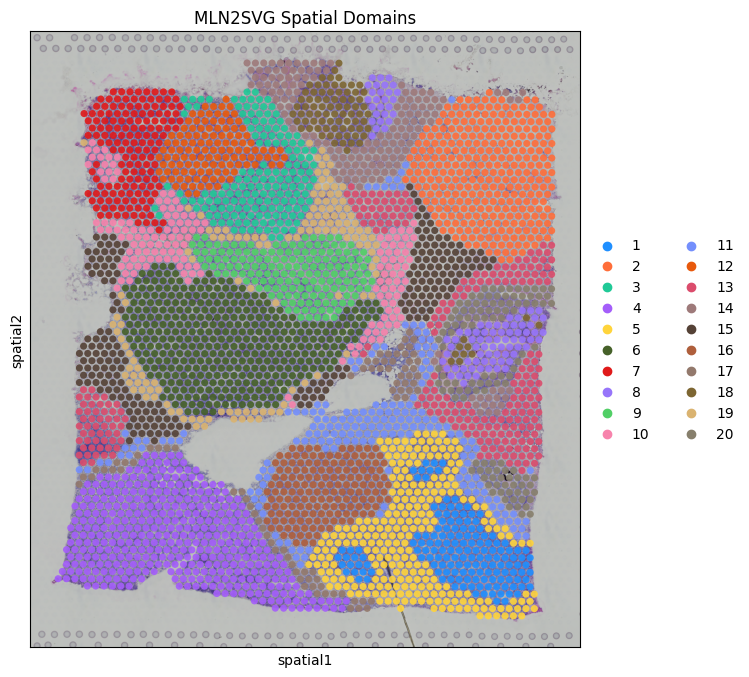

In [27]:
mln.plot_clusters(adata_result)

In [28]:

ARI = adjusted_rand_score(myadata.obs['Ground Truth'], adata_result.obs['mln2svg_clust'])
NMI = normalized_mutual_info_score(myadata.obs['Ground Truth'], adata_result.obs['mln2svg_clust'])

In [29]:
ARI,NMI

(0.5685829242682469, 0.6808245110971903)

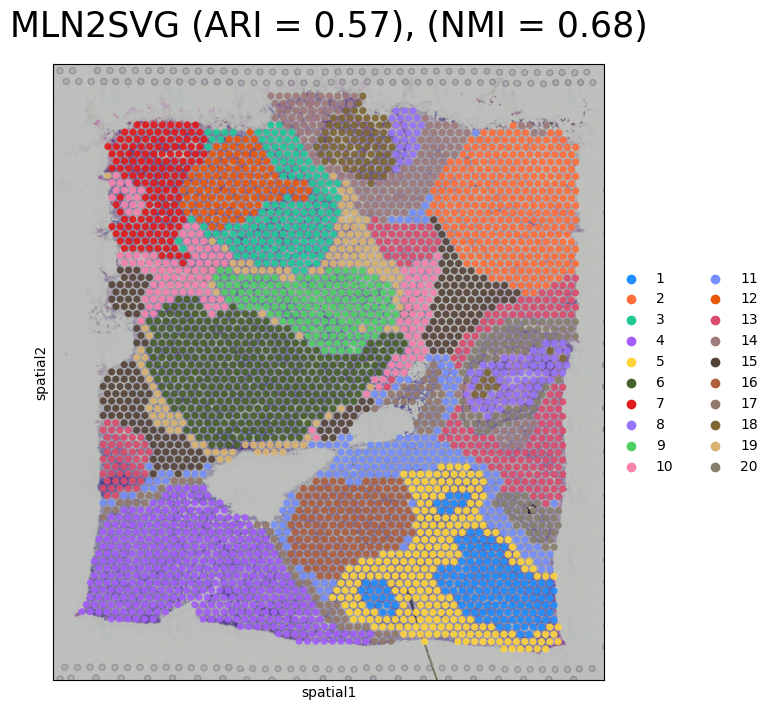

In [30]:
# Plot first
mln.plot_clusters(adata_processed)

# Then get current axis and add title
ax = plt.gca()
ax.set_title(f"MLN2SVG (ARI = {ARI:.2f}), (NMI = {NMI:.2f})", fontsize=25, pad=20)
plt.show()

/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


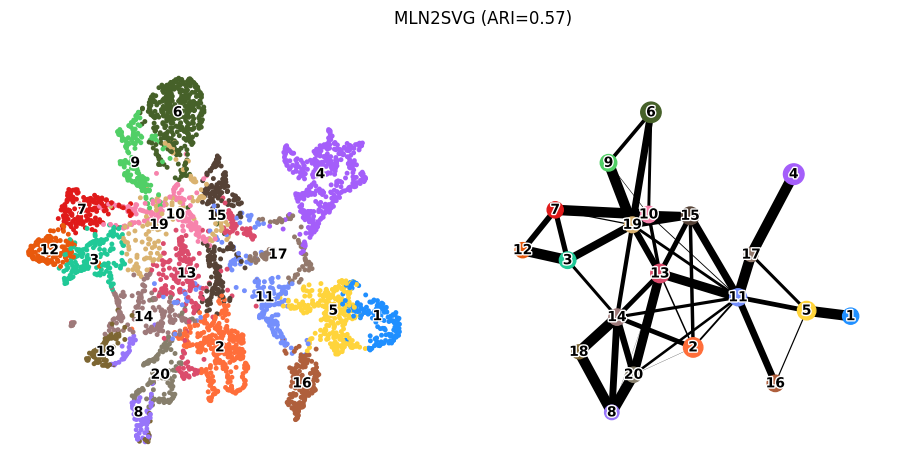

In [31]:

plot_umap_paga(adata_processed, cluster_key='mln2svg_clust', ari_score=ARI)


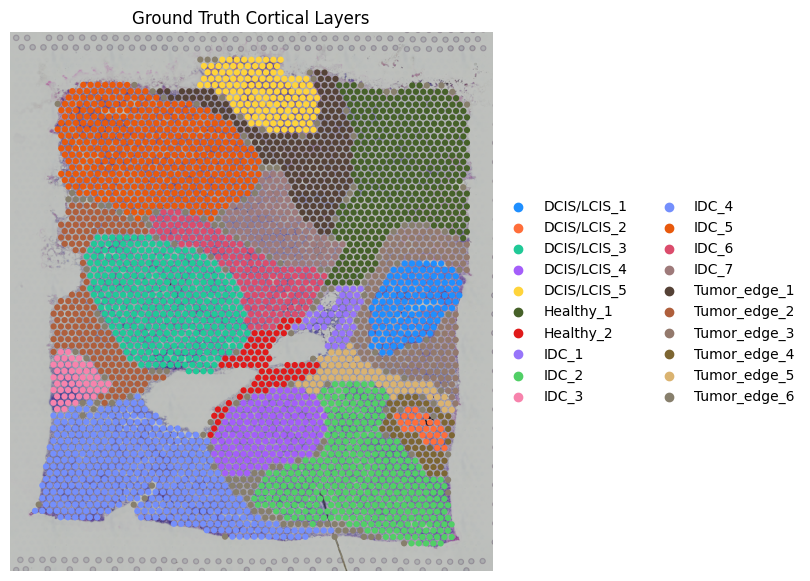

In [32]:
import matplotlib.pyplot as plt
import scanpy as sc

# Set figure size and style
plt.rcParams["figure.figsize"] = (7, 7)
plt.rcParams["figure.facecolor"] = "white"

# Plot ground truth spatial distribution
sc.pl.spatial(
    adata_processed,
    color=["Ground Truth"],  # Column name in n_adata.obs
    palette=custom_palette,
    img_key="hires",
    frameon=False,
    title="Ground Truth Cortical Layers",
    size=1.3,              # Optimal spot size
    legend_loc="right margin",
    save="_ground_truth.png"  # Saves high-res version
)

# Add publication-ready

In [33]:
sc.tl.umap(adata_processed)


/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


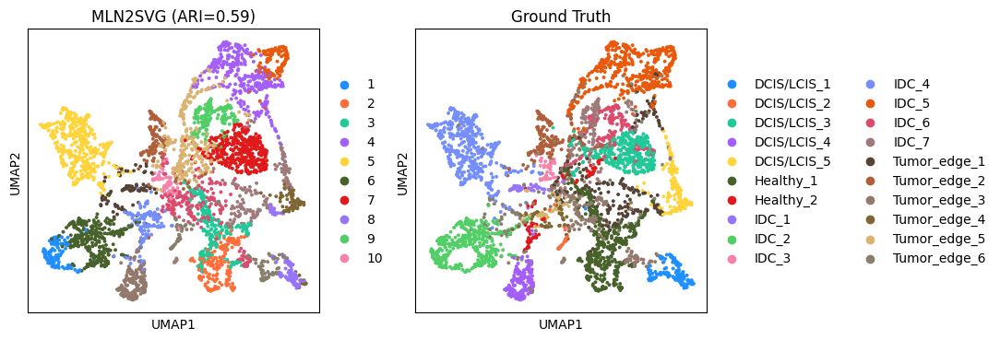

In [39]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata_processed, color=["mln2svg_clust", "Ground Truth"], title=['MLN2SVG (ARI=%.2f)'%ARI, "Ground Truth"])

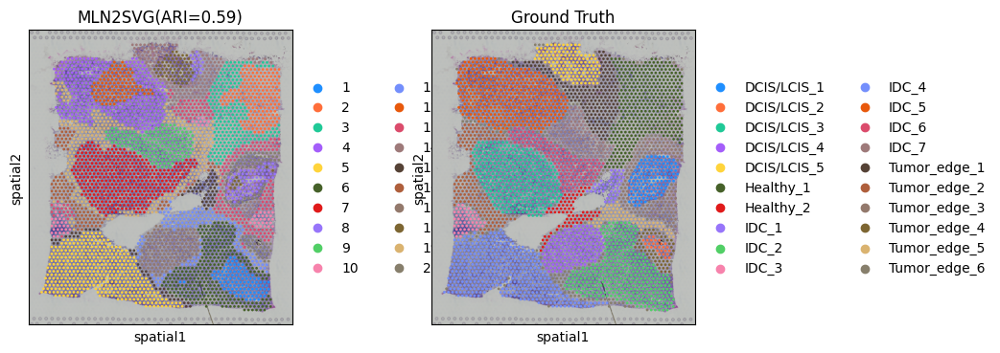

In [40]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.spatial(adata_processed, color=["mln2svg_clust", "Ground Truth"], title=['MLN2SVG(ARI=%.2f)'%ARI, "Ground Truth"])


# One Chunck


/data4/hussin/hussain/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/data4/hussin/hussain/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")



=== Running: Epochs=5000, Alpha=0.5 ===
Stage 1: Spatial data reconstruction in progress...
Spatial graph assembled—ready for the next step!
Phase 2: MLN2SVG Models training has benn started...


Training Loss: 17.5240: 100%|██████████| 30000/30000 [00:51<00:00, 582.39it/s]


✓ Model training completed successfully
Stage 3: Clustering initiated...
fitting ...
  |======================================================================| 100%
✓ Clustering completed successfully
Saved spatial plot to /data4/hussin/hussain/hussain/results_HBC/spatial_plots/spatial_epochs5000_alpha0.5.png


/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:98: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 2)
/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved UMAP+PAGA plot to /data4/hussin/hussain/hussain/results_HBC/umap_paga_plots/umap_paga_epochs5000_alpha0.5.png
ARI: 0.593, NMI: 0.698

=== Running: Epochs=5000, Alpha=0.7 ===
Stage 1: Spatial data reconstruction in progress...
Spatial graph assembled—ready for the next step!
Phase 2: MLN2SVG Models training has benn started...


Training Loss: 17.3640: 100%|██████████| 30000/30000 [00:52<00:00, 569.91it/s]


✓ Model training completed successfully
Stage 3: Clustering initiated...
fitting ...
  |======================================================================| 100%
✓ Clustering completed successfully
Saved spatial plot to /data4/hussin/hussain/hussain/results_HBC/spatial_plots/spatial_epochs5000_alpha0.7.png


/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:98: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 2)
/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved UMAP+PAGA plot to /data4/hussin/hussain/hussain/results_HBC/umap_paga_plots/umap_paga_epochs5000_alpha0.7.png
ARI: 0.562, NMI: 0.686

=== Running: Epochs=10000, Alpha=0.5 ===
Stage 1: Spatial data reconstruction in progress...
Spatial graph assembled—ready for the next step!
Phase 2: MLN2SVG Models training has benn started...


Training Loss: 17.3536: 100%|██████████| 30000/30000 [00:53<00:00, 565.65it/s]


✓ Model training completed successfully
Stage 3: Clustering initiated...
fitting ...
  |======================================================================| 100%
✓ Clustering completed successfully
Saved spatial plot to /data4/hussin/hussain/hussain/results_HBC/spatial_plots/spatial_epochs10000_alpha0.5.png


/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:98: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 2)
/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved UMAP+PAGA plot to /data4/hussin/hussain/hussain/results_HBC/umap_paga_plots/umap_paga_epochs10000_alpha0.5.png
ARI: 0.546, NMI: 0.694

=== Running: Epochs=10000, Alpha=0.7 ===
Stage 1: Spatial data reconstruction in progress...
Spatial graph assembled—ready for the next step!
Phase 2: MLN2SVG Models training has benn started...


Training Loss: 17.3516: 100%|██████████| 30000/30000 [00:51<00:00, 578.56it/s]


✓ Model training completed successfully
Stage 3: Clustering initiated...
fitting ...
  |======================================================================| 100%
✓ Clustering completed successfully
Saved spatial plot to /data4/hussin/hussain/hussain/results_HBC/spatial_plots/spatial_epochs10000_alpha0.7.png


/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:98: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 2)
/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved UMAP+PAGA plot to /data4/hussin/hussain/hussain/results_HBC/umap_paga_plots/umap_paga_epochs10000_alpha0.7.png
ARI: 0.554, NMI: 0.687

=== Running: Epochs=15000, Alpha=0.5 ===
Stage 1: Spatial data reconstruction in progress...
Spatial graph assembled—ready for the next step!
Phase 2: MLN2SVG Models training has benn started...


Training Loss: 17.3504: 100%|██████████| 30000/30000 [00:48<00:00, 622.85it/s]


✓ Model training completed successfully
Stage 3: Clustering initiated...
fitting ...
  |======================================================================| 100%
✓ Clustering completed successfully
Saved spatial plot to /data4/hussin/hussain/hussain/results_HBC/spatial_plots/spatial_epochs15000_alpha0.5.png


/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:98: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 2)
/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved UMAP+PAGA plot to /data4/hussin/hussain/hussain/results_HBC/umap_paga_plots/umap_paga_epochs15000_alpha0.5.png
ARI: 0.563, NMI: 0.688

=== Running: Epochs=15000, Alpha=0.7 ===
Stage 1: Spatial data reconstruction in progress...
Spatial graph assembled—ready for the next step!
Phase 2: MLN2SVG Models training has benn started...


Training Loss: 17.3497: 100%|██████████| 30000/30000 [00:52<00:00, 567.26it/s]


✓ Model training completed successfully
Stage 3: Clustering initiated...
fitting ...
  |======================================================================| 100%
✓ Clustering completed successfully
Saved spatial plot to /data4/hussin/hussain/hussain/results_HBC/spatial_plots/spatial_epochs15000_alpha0.7.png


/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:98: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 2)
/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved UMAP+PAGA plot to /data4/hussin/hussain/hussain/results_HBC/umap_paga_plots/umap_paga_epochs15000_alpha0.7.png
ARI: 0.553, NMI: 0.686

=== Running: Epochs=20000, Alpha=0.5 ===
Stage 1: Spatial data reconstruction in progress...
Spatial graph assembled—ready for the next step!
Phase 2: MLN2SVG Models training has benn started...


Training Loss: 17.3493: 100%|██████████| 30000/30000 [00:58<00:00, 513.93it/s]


✓ Model training completed successfully
Stage 3: Clustering initiated...
fitting ...
  |======================================================================| 100%
✓ Clustering completed successfully
Saved spatial plot to /data4/hussin/hussain/hussain/results_HBC/spatial_plots/spatial_epochs20000_alpha0.5.png


/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:244: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = pl.figure()
/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:98: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 2)
/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping prov

Saved UMAP+PAGA plot to /data4/hussin/hussain/hussain/results_HBC/umap_paga_plots/umap_paga_epochs20000_alpha0.5.png
ARI: 0.561, NMI: 0.694

=== Running: Epochs=20000, Alpha=0.7 ===
Stage 1: Spatial data reconstruction in progress...
Spatial graph assembled—ready for the next step!
Phase 2: MLN2SVG Models training has benn started...


Training Loss: 17.3490: 100%|██████████| 30000/30000 [00:56<00:00, 529.33it/s]


✓ Model training completed successfully
Stage 3: Clustering initiated...
fitting ...
  |======================================================================| 100%
✓ Clustering completed successfully
Saved spatial plot to /data4/hussin/hussain/hussain/results_HBC/spatial_plots/spatial_epochs20000_alpha0.7.png


/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:98: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 2)
/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved UMAP+PAGA plot to /data4/hussin/hussain/hussain/results_HBC/umap_paga_plots/umap_paga_epochs20000_alpha0.7.png
ARI: 0.561, NMI: 0.694

=== Running: Epochs=25000, Alpha=0.5 ===
Stage 1: Spatial data reconstruction in progress...
Spatial graph assembled—ready for the next step!
Phase 2: MLN2SVG Models training has benn started...


Training Loss: 17.3487: 100%|██████████| 30000/30000 [00:59<00:00, 504.70it/s]


✓ Model training completed successfully
Stage 3: Clustering initiated...
fitting ...
  |======================================================================| 100%
✓ Clustering completed successfully
Saved spatial plot to /data4/hussin/hussain/hussain/results_HBC/spatial_plots/spatial_epochs25000_alpha0.5.png


/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:98: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 2)
/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved UMAP+PAGA plot to /data4/hussin/hussain/hussain/results_HBC/umap_paga_plots/umap_paga_epochs25000_alpha0.5.png
ARI: 0.560, NMI: 0.693

=== Running: Epochs=25000, Alpha=0.7 ===
Stage 1: Spatial data reconstruction in progress...
Spatial graph assembled—ready for the next step!
Phase 2: MLN2SVG Models training has benn started...


Training Loss: 17.3485: 100%|██████████| 30000/30000 [00:57<00:00, 518.02it/s]


✓ Model training completed successfully
Stage 3: Clustering initiated...
fitting ...
  |======================================================================| 100%
✓ Clustering completed successfully
Saved spatial plot to /data4/hussin/hussain/hussain/results_HBC/spatial_plots/spatial_epochs25000_alpha0.7.png


/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:98: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 2)
/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved UMAP+PAGA plot to /data4/hussin/hussain/hussain/results_HBC/umap_paga_plots/umap_paga_epochs25000_alpha0.7.png
ARI: 0.548, NMI: 0.689

=== Running: Epochs=30000, Alpha=0.5 ===
Stage 1: Spatial data reconstruction in progress...
Spatial graph assembled—ready for the next step!
Phase 2: MLN2SVG Models training has benn started...


Training Loss: 17.3484: 100%|██████████| 30000/30000 [00:58<00:00, 516.50it/s]


✓ Model training completed successfully
Stage 3: Clustering initiated...
fitting ...
  |======================================================================| 100%
✓ Clustering completed successfully
Saved spatial plot to /data4/hussin/hussain/hussain/results_HBC/spatial_plots/spatial_epochs30000_alpha0.5.png


/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:98: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 2)
/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved UMAP+PAGA plot to /data4/hussin/hussain/hussain/results_HBC/umap_paga_plots/umap_paga_epochs30000_alpha0.5.png
ARI: 0.560, NMI: 0.694

=== Running: Epochs=30000, Alpha=0.7 ===
Stage 1: Spatial data reconstruction in progress...
Spatial graph assembled—ready for the next step!
Phase 2: MLN2SVG Models training has benn started...


Training Loss: 17.3482: 100%|██████████| 30000/30000 [00:57<00:00, 521.14it/s]


✓ Model training completed successfully
Stage 3: Clustering initiated...
fitting ...
  |======================================================================| 100%
✓ Clustering completed successfully
Saved spatial plot to /data4/hussin/hussain/hussain/results_HBC/spatial_plots/spatial_epochs30000_alpha0.7.png


/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:98: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 2)
/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved UMAP+PAGA plot to /data4/hussin/hussain/hussain/results_HBC/umap_paga_plots/umap_paga_epochs30000_alpha0.7.png
ARI: 0.560, NMI: 0.694

=== Running: Epochs=35000, Alpha=0.5 ===
Stage 1: Spatial data reconstruction in progress...
Spatial graph assembled—ready for the next step!
Phase 2: MLN2SVG Models training has benn started...


Training Loss: 17.3481: 100%|██████████| 30000/30000 [00:58<00:00, 511.13it/s]


✓ Model training completed successfully
Stage 3: Clustering initiated...
fitting ...
  |======================================================================| 100%
✓ Clustering completed successfully
Saved spatial plot to /data4/hussin/hussain/hussain/results_HBC/spatial_plots/spatial_epochs35000_alpha0.5.png


/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:98: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 2)
/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved UMAP+PAGA plot to /data4/hussin/hussain/hussain/results_HBC/umap_paga_plots/umap_paga_epochs35000_alpha0.5.png
ARI: 0.563, NMI: 0.688

=== Running: Epochs=35000, Alpha=0.7 ===
Stage 1: Spatial data reconstruction in progress...
Spatial graph assembled—ready for the next step!
Phase 2: MLN2SVG Models training has benn started...


Training Loss: 17.3480: 100%|██████████| 30000/30000 [00:59<00:00, 502.44it/s]


✓ Model training completed successfully
Stage 3: Clustering initiated...
fitting ...
  |======================================================================| 100%
✓ Clustering completed successfully
Saved spatial plot to /data4/hussin/hussain/hussain/results_HBC/spatial_plots/spatial_epochs35000_alpha0.7.png


/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:98: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 2)
/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved UMAP+PAGA plot to /data4/hussin/hussain/hussain/results_HBC/umap_paga_plots/umap_paga_epochs35000_alpha0.7.png
ARI: 0.563, NMI: 0.688

=== Running: Epochs=40000, Alpha=0.5 ===
Stage 1: Spatial data reconstruction in progress...
Spatial graph assembled—ready for the next step!
Phase 2: MLN2SVG Models training has benn started...


Training Loss: 17.3479: 100%|██████████| 30000/30000 [00:59<00:00, 501.94it/s]


✓ Model training completed successfully
Stage 3: Clustering initiated...
fitting ...
  |======================================================================| 100%
✓ Clustering completed successfully
Saved spatial plot to /data4/hussin/hussain/hussain/results_HBC/spatial_plots/spatial_epochs40000_alpha0.5.png


/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:98: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 2)
/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved UMAP+PAGA plot to /data4/hussin/hussain/hussain/results_HBC/umap_paga_plots/umap_paga_epochs40000_alpha0.5.png
ARI: 0.560, NMI: 0.694

=== Running: Epochs=40000, Alpha=0.7 ===
Stage 1: Spatial data reconstruction in progress...
Spatial graph assembled—ready for the next step!
Phase 2: MLN2SVG Models training has benn started...


Training Loss: 17.3478: 100%|██████████| 30000/30000 [00:57<00:00, 520.98it/s]


✓ Model training completed successfully
Stage 3: Clustering initiated...
fitting ...
  |======================================================================| 100%
✓ Clustering completed successfully
Saved spatial plot to /data4/hussin/hussain/hussain/results_HBC/spatial_plots/spatial_epochs40000_alpha0.7.png


/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:98: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 2)
/data4/hussin/hussain/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_4190965/2833685731.py:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved UMAP+PAGA plot to /data4/hussin/hussain/hussain/results_HBC/umap_paga_plots/umap_paga_epochs40000_alpha0.7.png
ARI: 0.562, NMI: 0.688

=== Best Configuration ===
Epochs: 5000.0
Alpha: 0.5
Best ARI: 0.593
Corresponding NMI: 0.698

All results saved to: /data4/hussin/hussain/hussain/results_HBC/hyperparameter_tuning_results.csv


<Figure size 800x600 with 0 Axes>

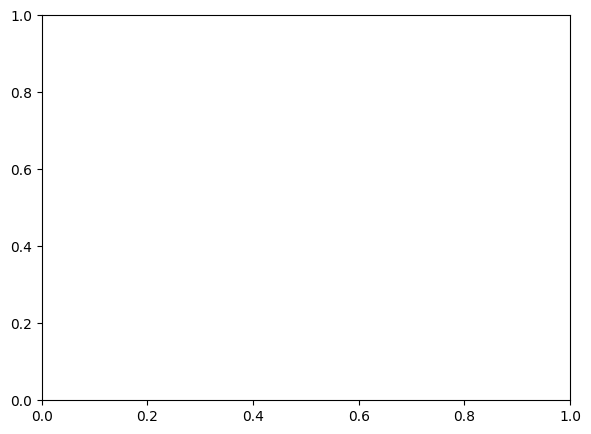

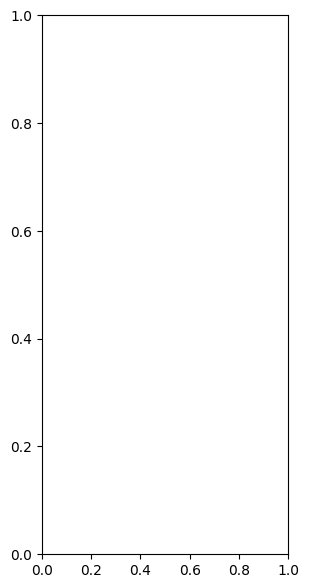

<Figure size 800x600 with 0 Axes>

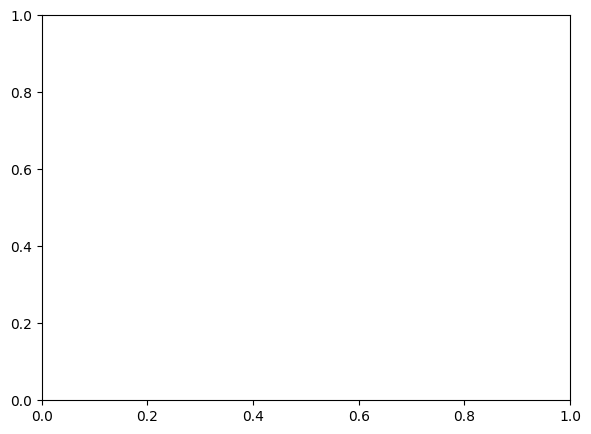

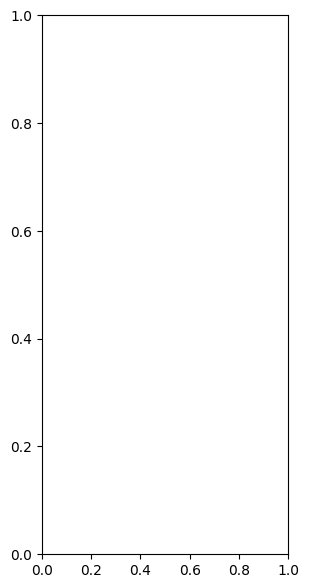

<Figure size 800x600 with 0 Axes>

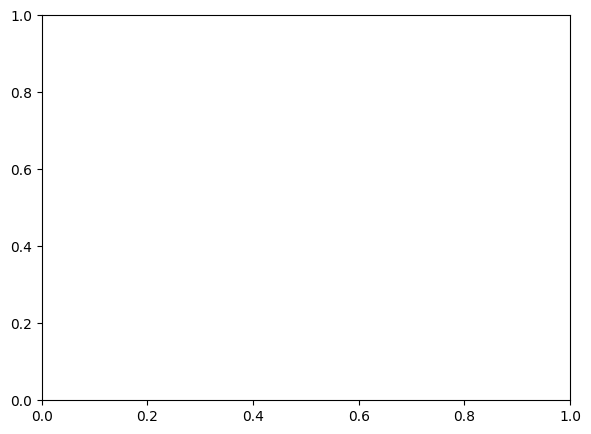

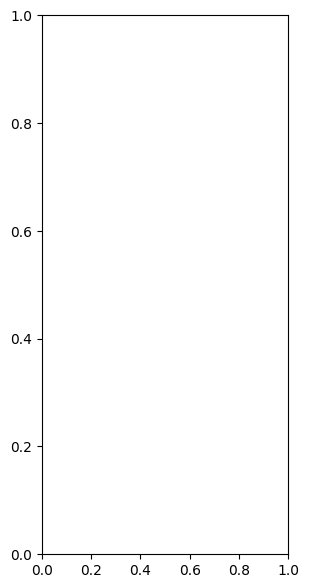

<Figure size 800x600 with 0 Axes>

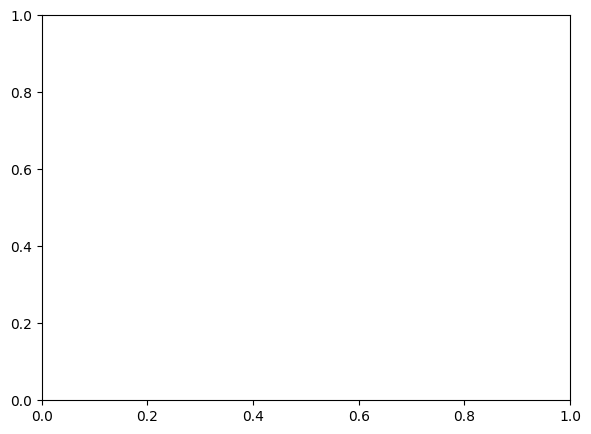

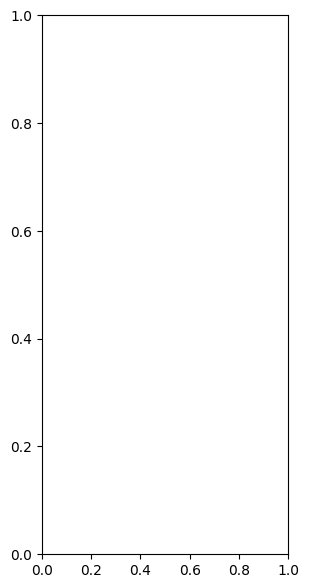

<Figure size 800x600 with 0 Axes>

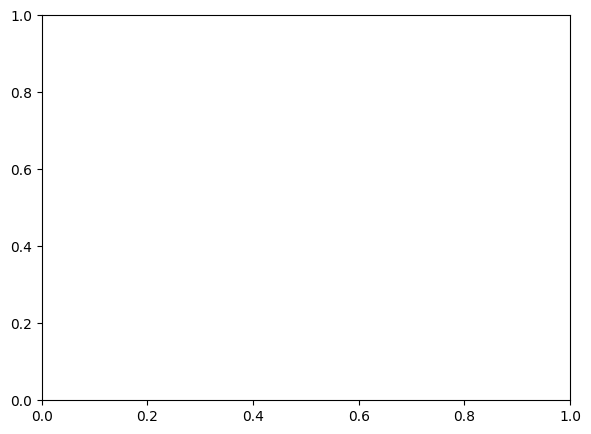

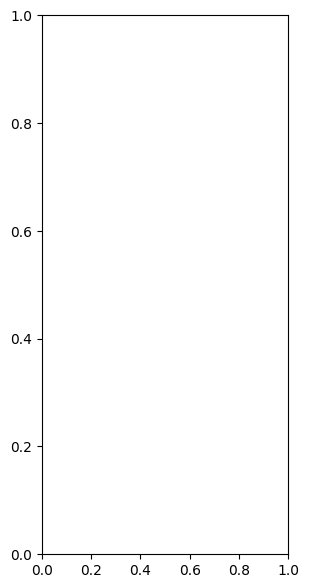

<Figure size 800x600 with 0 Axes>

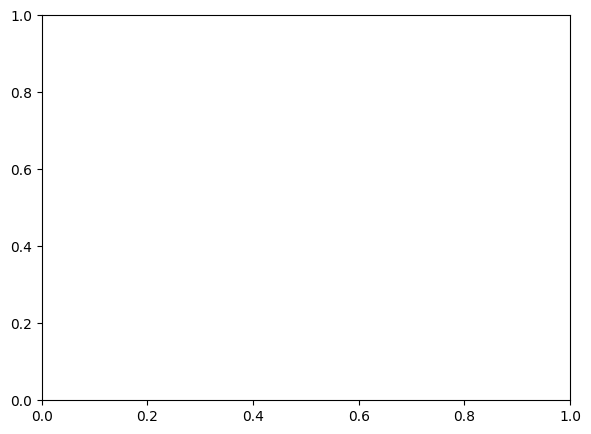

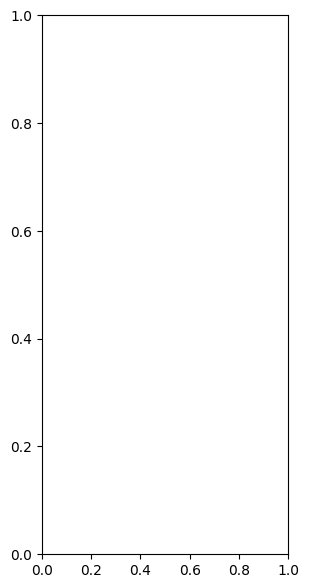

<Figure size 800x600 with 0 Axes>

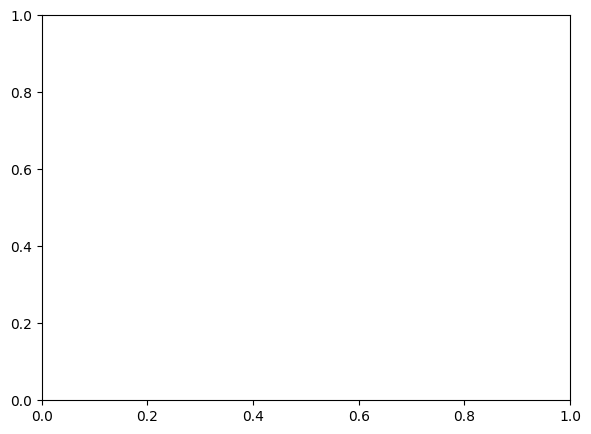

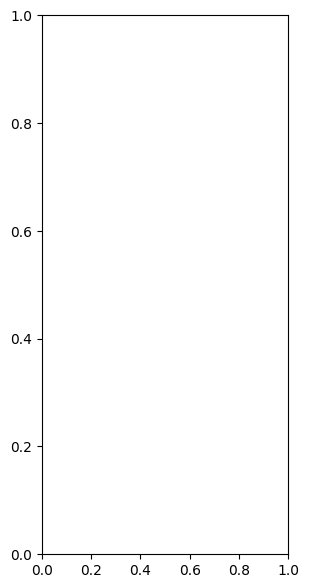

<Figure size 800x600 with 0 Axes>

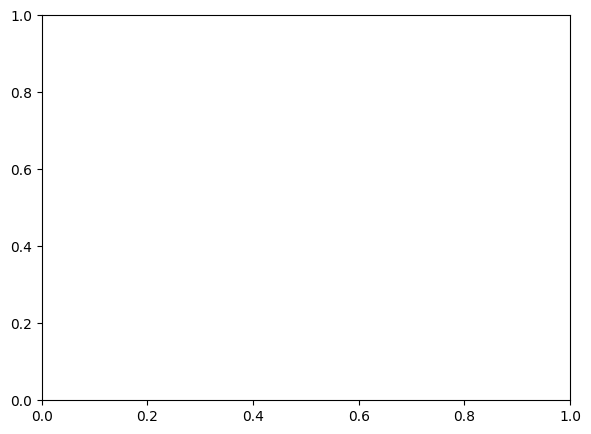

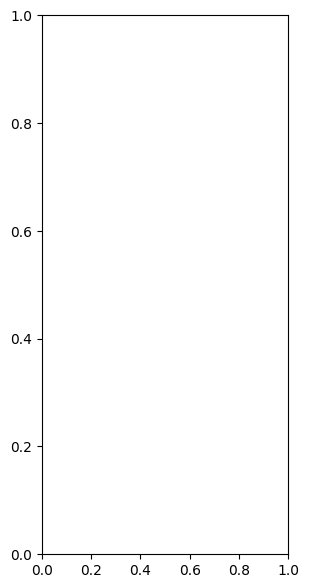

<Figure size 800x600 with 0 Axes>

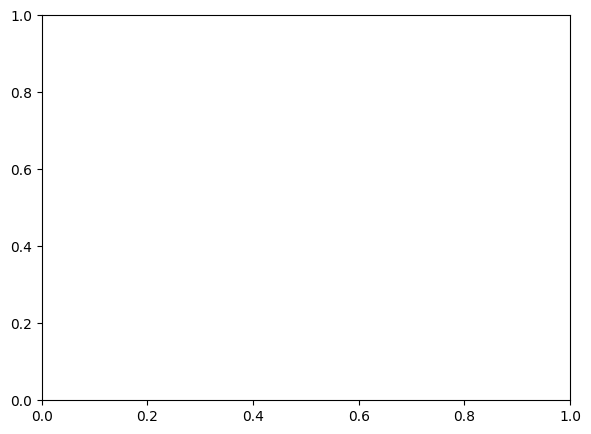

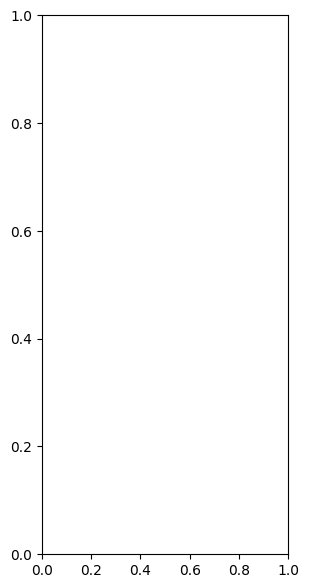

<Figure size 800x600 with 0 Axes>

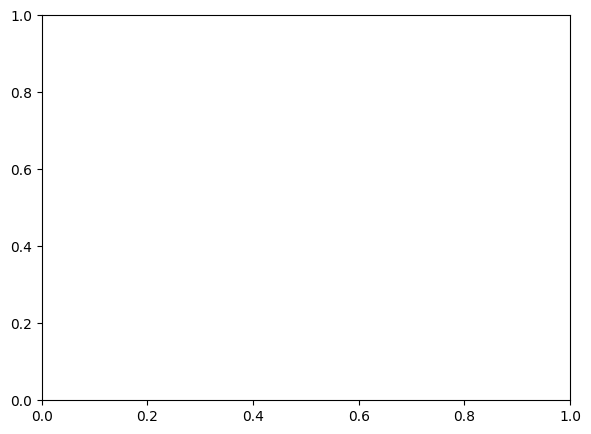

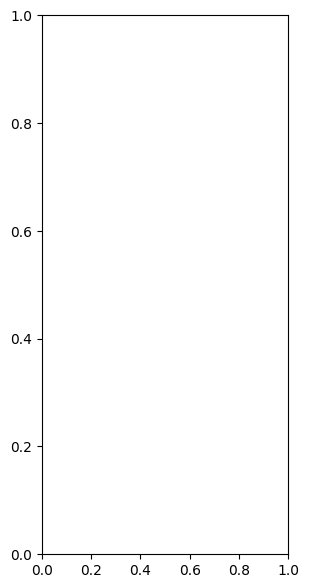

<Figure size 800x600 with 0 Axes>

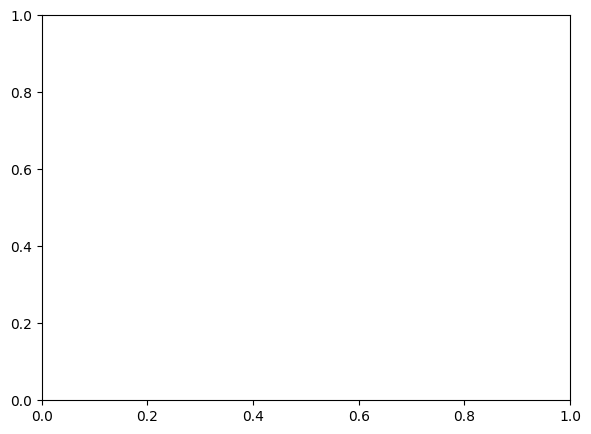

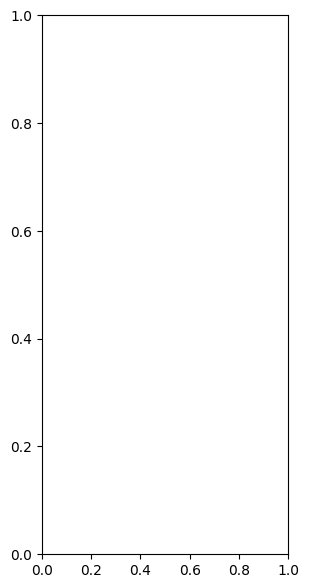

<Figure size 800x600 with 0 Axes>

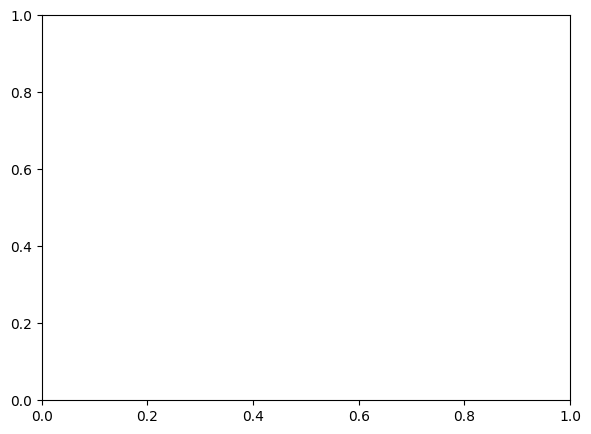

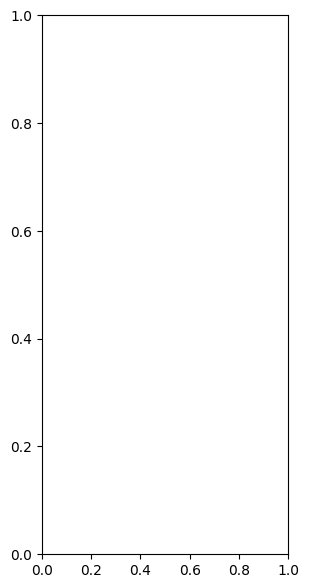

<Figure size 800x600 with 0 Axes>

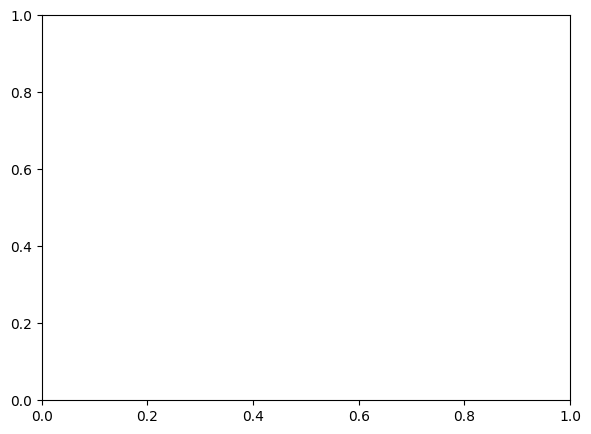

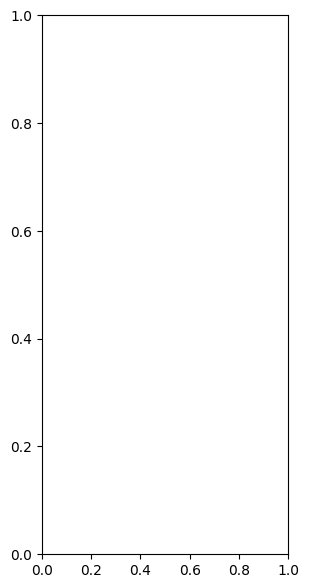

<Figure size 800x600 with 0 Axes>

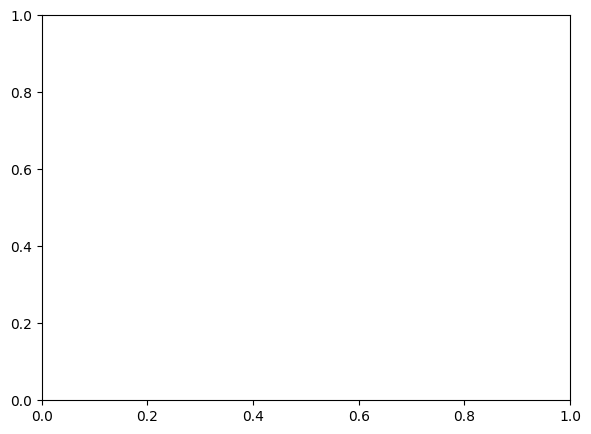

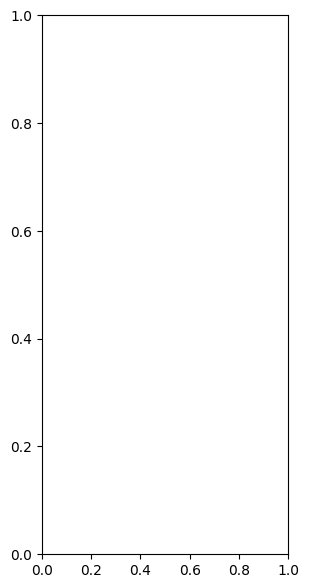

<Figure size 800x600 with 0 Axes>

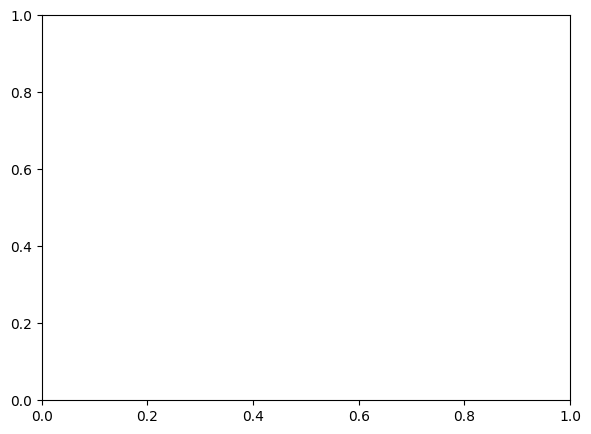

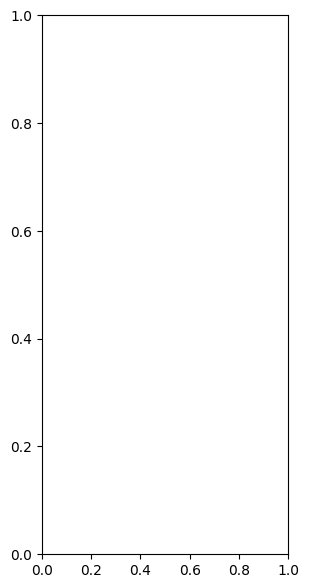

<Figure size 800x600 with 0 Axes>

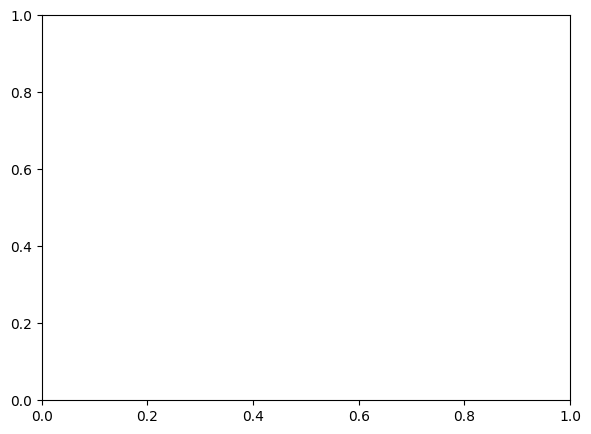

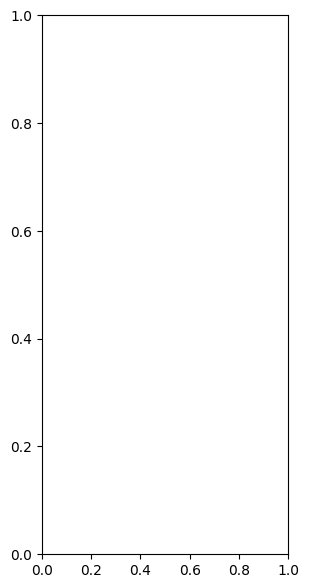

In [ ]:
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
import os
import cv2

# Define parameter ranges (only epochs and alpha as requested)
epochs_range = range(5000, 40001, 5000)  # 5000 to 30000 in steps of 5000
alphas = [round(x, 1) for x in [0.5, 0.7]]  # 0.5 to 0.7 in steps of 0.1

# Load ground truth metadata
Ann_df = pd.read_csv('/data4/hussin/hussain/data/BRCA1/metadata.tsv', 
                    sep='\t', header=0, index_col=0)

# Load Visium data
input_dir = os.path.join('/data4/hussin/hussain/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1')
myadata = sc.read_visium(path=input_dir, count_file='filtered_feature_bc_matrix.h5')

# Make sure the variable names are unique
myadata.var_names_make_unique()

# Load spatial image and add it to the AnnData object
img = cv2.imread(input_dir + "/spatial/tissue_hires_image.png")
myadata.uns['image'] = img

# Add ground truth to adata object
myadata.obs['Ground Truth'] = Ann_df.loc[myadata.obs_names, 'fine_annot_type']  # or 'fine_annot_type'

# Preprocessing: Select highly variable genes
sc.pp.highly_variable_genes(myadata, n_top_genes=3000, flavor='seurat_v3')  # Select the top 3000 variable genes

# Create results directory and subdirectories if they don't exist
results_dir = '/data4/hussin/hussain/hussain/results_HBC'
spatial_dir = os.path.join(results_dir, 'spatial_plots')
umap_paga_dir = os.path.join(results_dir, 'umap_paga_plots')

os.makedirs(results_dir, exist_ok=True)
os.makedirs(spatial_dir, exist_ok=True)
os.makedirs(umap_paga_dir, exist_ok=True)

# Initialize the MLN2SVG model
mln = MLN2SVG(myadata, num_cluster=20, n_epochs=30000, alpha=0.1, lr=1e-4)

# Create results storage
results = []

# Main optimization loop for hyperparameter tuning
for n_epochs in epochs_range:
    for alpha in alphas:
        print(f"\n=== Running: Epochs={n_epochs}, Alpha={alpha} ===")
        
        try:
            # Unpack the values returned by myspa.load_data()
            n_adata, original_data, augment_data, stg_adj = mln.load_data()
            
            # Unpacking the values returned by train_MLN2SVG
            latent_original, latent_aug, _, _ = mln.train_MLN2SVG(original_data, augment_data, stg_adj)
            
            # Compute clusters using the latent variables
            adata_result = mln.compute_clusters(myadata, latent_original)
            
            # Ensure we only compare cells that have both predicted and ground truth labels
            valid_cells = adata_result.obs.index.intersection(Ann_df.index)
            GT_labels = Ann_df.loc[valid_cells, 'fine_annot_type']
            pred_labels = adata_result.obs.loc[valid_cells, 'mln2svg_clust']
            
            # Calculate ARI and NMI
            ARI = adjusted_rand_score(GT_labels, pred_labels)
            NMI = normalized_mutual_info_score(GT_labels, pred_labels)
            
            # Store results
            results.append({
                'Epochs': n_epochs,
                'Alpha': alpha,
                'ARI': ARI,
                'NMI': NMI
            })
            
            # Create and save spatial plot
            plt.figure(figsize=(8, 6))
            mln.plot_clusters(adata_result)
            plt.title(f"Spatial (ARI={ARI:.2f}, NMI={NMI:.2f})\nEpochs={n_epochs}, α={alpha}", fontsize=10)
            spatial_path = os.path.join(spatial_dir, f'spatial_epochs{n_epochs}_alpha{alpha}.png')
            plt.savefig(spatial_path, dpi=300, bbox_inches='tight')
            plt.close()
            print(f"Saved spatial plot to {spatial_path}")
            
            # Create and save UMAP + PAGA plot
            plt.figure(figsize=(15, 5))
            
            # UMAP plot
            plt.subplot(1, 2, 1)
            sc.tl.umap(adata_result)
            sc.pl.umap(adata_result, color='mln2svg_clust', show=False, title='UMAP')
            
            # PAGA plot
            plt.subplot(1, 2, 2)
            sc.tl.paga(adata_result, groups='mln2svg_clust')
            sc.pl.paga_compare(
                adata_result,
                legend_fontsize=15,
                frameon=False,
                size=50,
                node_size_scale=4,
                title=f'PAGA (ARI={ARI:.2f})',
                legend_fontoutline=2,
                edge_width_scale=1.5,
                show=False
            )
            
            plt.tight_layout()
            umap_paga_path = os.path.join(umap_paga_dir, f'umap_paga_epochs{n_epochs}_alpha{alpha}.png')
            plt.savefig(umap_paga_path, dpi=300, bbox_inches='tight')
            plt.close()
            print(f"Saved UMAP+PAGA plot to {umap_paga_path}")
            
            print(f"ARI: {ARI:.3f}, NMI: {NMI:.3f}")
            
        except Exception as e:
            print(f"Error with Epochs={n_epochs}, Alpha={alpha}: {str(e)}")
            continue

# Save results to CSV
results_df = pd.DataFrame(results)
results_path = os.path.join(results_dir, 'hyperparameter_tuning_results.csv')
results_df.to_csv(results_path, index=False)

# Print best performing configuration
if not results_df.empty:
    best_run = results_df.loc[results_df['ARI'].idxmax()]
    print("\n=== Best Configuration ===")
    print(f"Epochs: {best_run['Epochs']}")
    print(f"Alpha: {best_run['Alpha']}")
    print(f"Best ARI: {best_run['ARI']:.3f}")
    print(f"Corresponding NMI: {best_run['NMI']:.3f}")
    print(f"\nAll results saved to: {results_path}")
else:
    print("No successful runs completed.")


# **SVG Detection**

In [41]:
adata_processed

AnnData object with n_obs × n_vars = 3798 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'Ground Truth', 'mclust', 'mln2svg_clust'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'spatial', 'image', 'hvg', 'Ground Truth_colors', 'log1p', 'pca', 'reconstruct_spatial_expression', 'neighbors', 'mln2svg_clust_colors', 'umap'
    obsm: 'spatial', 'MLN2SVG', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'log1p_original', 'log1p_augmented'
    obsp: 'distances', 'connectivities'

In [45]:
import utils
n_clusters=20
adjacency_matrix = {}

for cluster_id in range(1, n_clusters + 1):
    adjacency_matrix[cluster_id] = utils.find_neighbor_domains(target_cluster=cluster_id, n_adata=adata_processed)


Calculating adjacency matrix using xy coordinates...
Calculating adjacency matrix using xy coordinates...
Calculating adjacency matrix using xy coordinates...
Run 1: radius [274.11676025390625, 3148.3916015625], neighbors [4.807017543859649, 344.5701754385965]
Calculating adjacency matrix using xy coordinates...
Run 2: radius [274.11676025390625, 1711.2541809082031], neighbors [4.807017543859649, 133.3421052631579]
Calculating adjacency matrix using xy coordinates...
Run 3: radius [274.11676025390625, 992.6854705810547], neighbors [4.807017543859649, 53.42982456140351]
Calculating adjacency matrix using xy coordinates...
Run 4: radius [274.11676025390625, 633.4011154174805], neighbors [4.807017543859649, 18.850877192982455]
Calculating adjacency matrix using xy coordinates...
Run 5: radius [453.75893783569336, 633.4011154174805], neighbors [6.991228070175438, 18.850877192982455]
Calculating adjacency matrix using xy coordinates...
Recommended radius = 543.5800266265869, neighbors=12.92

In [46]:
adjacency_matrix

{1: [6],
 2: [3],
 3: [2, 13, 14],
 4: [19, 12],
 5: [15],
 6: [1, 11, 15],
 7: [19, 9],
 8: [20, 18],
 9: [19],
 10: [13],
 11: [6, 17, 20, 15],
 12: [4],
 13: [20, 10, 14, 3, 11],
 14: [13, 18, 8],
 15: [5],
 16: [19, 15],
 17: [11],
 18: [8, 14],
 19: [7, 4, 16, 9, 10],
 20: [13, 8]}

In [44]:
#!pip install networkx

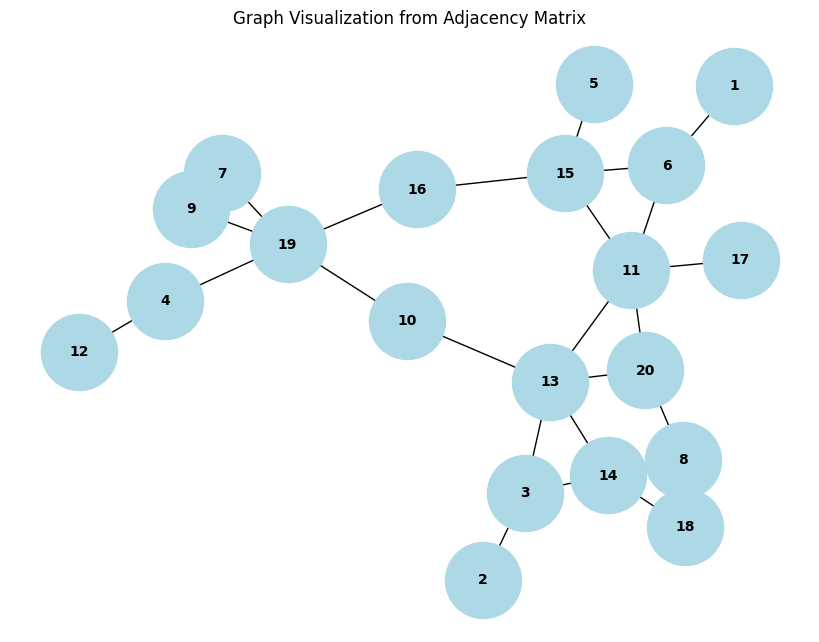

In [47]:
import networkx as nx
import matplotlib.pyplot as plt

# Create an empty graph
G = nx.Graph()

# Add edges to the graph
for node, neighbors in adjacency_matrix.items():
    for neighbor in neighbors:
        G.add_edge(node, neighbor)

# Plot the graph
plt.figure(figsize=(8, 6))
nx.draw(
    G,
    with_labels=True,
    node_color="lightblue",
    font_weight="bold",
    node_size=3000,
    font_size=10,
)
plt.title("Graph Visualization from Adjacency Matrix")
plt.show()


In [48]:
print(type(adjacency_matrix))  # To check the type of the object
print(adjacency_matrix)        # To inspect the content


<class 'dict'>
{1: [6], 2: [3], 3: [2, 13, 14], 4: [19, 12], 5: [15], 6: [1, 11, 15], 7: [19, 9], 8: [20, 18], 9: [19], 10: [13], 11: [6, 17, 20, 15], 12: [4], 13: [20, 10, 14, 3, 11], 14: [13, 18, 8], 15: [5], 16: [19, 15], 17: [11], 18: [8, 14], 19: [7, 4, 16, 9, 10], 20: [13, 8]}


In [49]:
# After calculating adjacency_matrix as shown previously
spatial_markers_1 = utils.find_spatial_markers(
    adata=adata_processed,
    adjacency_matrix=adjacency_matrix,
    cluster_column="mclust",
    min_in_group_fraction=0.8,
    min_in_out_group_ratio=1.0,
    min_fold_change=1.2
)

# spatial_markers will contain the list of filtered DataFrames

SVGs for domain 1: ['AC008663.1', 'Z82246.1', 'CMYA5', 'SETMAR', 'KIF12', 'MIR200CHG', 'PLPPR3', 'PSCA', 'PC', 'KLF8', 'S1PR3', 'ABCC12', 'SATB2', 'ERP27', 'ADAMTS15', 'SLC1A2', 'REEP1', 'STC1', 'TTC39B', 'ABCA12', 'DHRS2']
Number of significant genes: 21
SVGs for domain 2: ['TNS2', 'SERBP1', 'CALD1', 'GGT5', 'GSN', 'PLEKHO1', 'BGN', 'CEBPB', 'CXCL12', 'DCN', 'SNHG8', 'GPX3', 'MMP2', 'NNMT', 'MYL12A', 'IFITM1', 'ELP2', 'TPM2', 'LTBP3', 'ZYX', 'CCN1', 'ISLR', 'EGFL7', 'PECAM1', 'EGR1', 'SRSF7', 'CD99', 'PDGFRB', 'CAVIN1', 'C1S', 'VWF', 'ACKR1', 'MFGE8', 'ITGA5', 'PCOLCE', 'LRP1', 'NFIB', 'NR4A1', 'NR1H2', 'SPP1', 'ATP5IF1', 'KLF2', 'ID3', 'SEPTIN7', 'STAB1', 'RCN1', 'MGAT1', 'COL5A2', 'EHD2', 'CAVIN3', 'FBLN1', 'EFEMP1', 'CNN3', 'TNXB', 'FBLN2', 'CCL21', 'SYPL1', 'CLDN5', 'COL5A1', 'ELN', 'PLVAP', 'EIF5B', 'ATXN10', 'PTGDS', 'PPP1R14B', 'LIMS2', 'TINAGL1', 'PMP22', 'EMP1', 'LEPROT', 'TGFBR2', 'DEPP1', 'RRAS', 'CD93', 'LHFPL6', 'PLAC9', 'UPK3BL1', 'ATP2B4', 'PRNP', 'HDAC7', 'CCL14', 'TRI

In [50]:
spatial_markers_1 

[          genes  in_group_fraction  out_group_fraction  in_out_group_ratio  \
 18   AC008663.1           1.000000            0.745645            1.341121   
 117    Z82246.1           1.000000            0.989547            1.010563   
 495       CMYA5           1.000000            0.996516            1.003497   
 300      SETMAR           1.000000            0.996516            1.003497   
 258       KIF12           1.000000            0.996516            1.003497   
 254   MIR200CHG           1.000000            0.996516            1.003497   
 249      PLPPR3           1.000000            0.989547            1.010563   
 204        PSCA           1.000000            0.993031            1.007018   
 162          PC           1.000000            0.972125            1.028674   
 151        KLF8           1.000000            0.986063            1.014134   
 102       S1PR3           1.000000            0.996516            1.003497   
 28       ABCC12           1.000000            0.979

In [52]:

second_order_adjacency = utils.compute_second_order_adjacency(adjacency_matrix)

Multi-level (second-order) adjacency matrix computed
{1: [5, 13, 15, 17, 20], 2: [8, 10, 11, 13, 14, 18, 20], 3: [6, 8, 11, 15, 17, 18, 19, 20], 4: [9, 13, 15], 5: [1, 19, 13, 17], 6: [3, 8, 10, 13, 14, 20], 7: [12, 13, 15], 8: [2, 3, 6, 10, 11, 13, 14, 17], 9: [4, 12, 13, 15, 16], 10: [2, 6, 8, 11, 12, 14, 15, 17, 18, 20], 11: [2, 3, 8, 10, 14, 18, 19], 12: [16, 9, 10, 7], 13: [1, 2, 4, 5, 6, 7, 8, 9, 15, 16, 17, 18], 14: [2, 6, 8, 10, 11, 15, 17, 19, 20], 15: [1, 3, 4, 7, 9, 10, 13, 14, 17, 20], 16: [9, 12, 13], 17: [1, 3, 5, 8, 10, 13, 14, 15, 20], 18: [2, 3, 10, 11, 13, 20], 19: [3, 5, 11, 14, 20], 20: [1, 2, 3, 6, 10, 14, 15, 17, 18, 19]}
Result type: <class 'dict'>


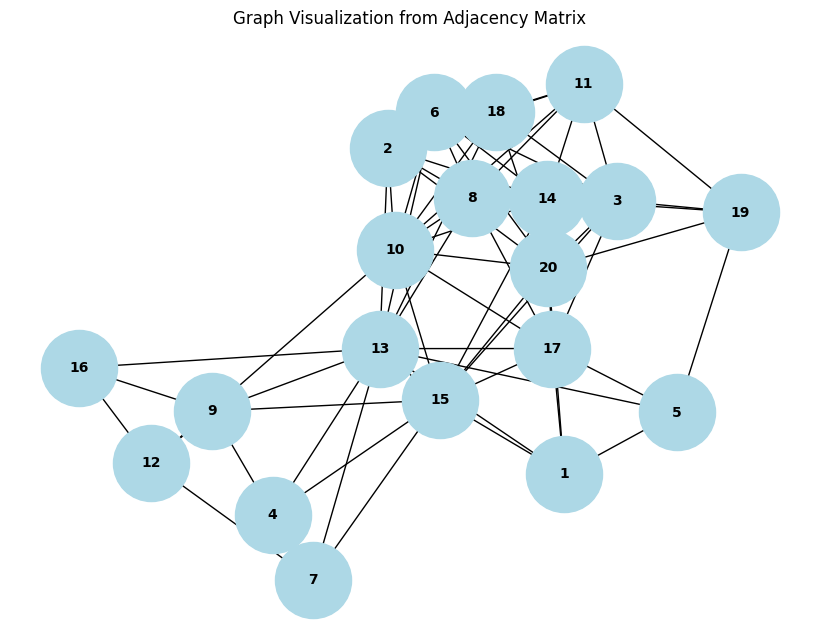

In [53]:
import networkx as nx
import matplotlib.pyplot as plt

# Create an empty graph
G = nx.Graph()

# Add edges to the graph
for node, neighbors in second_order_adjacency .items():
    for neighbor in neighbors:
        G.add_edge(node, neighbor)

# Plot the graph
plt.figure(figsize=(8, 6))
nx.draw(
    G,
    with_labels=True,
    node_color="lightblue",
    font_weight="bold",
    node_size=3000,
    font_size=10,
)
plt.title("Graph Visualization from Adjacency Matrix")
plt.show()


In [54]:
print("Number of keys in third_adj:", len(second_order_adjacency ))

Number of keys in third_adj: 20


In [56]:
# Compute second-order adjacency
# Find SVGs using second-order relationships
spatial_markers_2 = utils.find_multi_order_svg(
    adata=adata_processed,
    adjacency_dict=second_order_adjacency,
    cluster_column="mclust",
    min_in_group_fraction=0.8,
    min_in_out_group_ratio=1.0,
    min_fold_change=1.2
)

SVGs for domain 1: ['SLITRK6', 'CUL2', 'RIDA', 'ZBTB41', 'EPHX2', 'ATRN', 'ZCCHC2', 'SAR1B', 'GIGYF2', 'ZNF7', 'GLRX2', 'DCAF11', 'R3HDM2', 'C6orf132', 'MYO5B', 'EFS', 'POGK', 'AFTPH', 'SMIM10L1', 'SP1', 'ACTL6A', 'ALDH6A1', 'APPL2', 'SYT7', 'ANAPC13', 'PXMP4', 'SP3', 'ZFAND6', 'NCOA5', 'STX6', 'RAB30', 'BCAS4', 'TENT2', 'NR3C1', 'EPS8L1', 'IFIH1', 'JADE3', 'COMMD10', 'RRP15', 'PYM1', 'GGCX', 'C2orf68', 'PSMD11', 'DDX59', 'VPS4B', 'CCDC43', 'MIB1', 'MT1A', 'PIGN', 'COX7A2L', 'KHNYN', 'COPS8', 'FARSB', 'DHTKD1', 'PCMTD2', 'RBBP5', 'OCRL', 'GSK3B', 'PTPN1', 'SGPL1', 'ARHGAP39', 'PIN4', 'PHF3', 'ECT2', 'CCNC', 'DNAJA2', 'C16orf74', 'SLC2A10', 'BAZ1A', 'ZC3H4', 'TMEM167A', 'ZMAT2', 'TSHZ1', 'DHX34', 'PREPL', 'ALG2', 'PDPR', 'ZNF219', 'EPG5', 'PPP4R3B', 'OLA1', 'ALDH7A1', 'HIST1H3H', 'WEE1', 'HMGCS1', 'SYCP2', 'MSMO1', 'PANK3', 'SOX12', 'CDK13', 'DUSP12', 'SIN3A', 'HOXC9', 'ZXDC', 'GON4L', 'MISP', 'KLHL36', 'EPRS', 'KANSL3', 'PHF13', 'SLC35F5', 'ALDH5A1', 'DHX29', 'C1orf198', 'MED23', 'DLG3

In [55]:
spatial_markers_2

[        genes  in_group_fraction  out_group_fraction  in_out_group_ratio  \
 3          TF           1.000000            0.991722            1.008347   
 102       CD9           1.000000            0.947020            1.055944   
 148   SLC12A2           1.000000            0.849338            1.177388   
 144     OLIG1           1.000000            0.985099            1.015126   
 131   SLC44A1           1.000000            0.970199            1.030717   
 ..        ...                ...                 ...                 ...   
 171      LIPA           0.931452            0.781457            1.191942   
 61    SLCO1A2           0.931452            0.443709            2.099242   
 99   CDC42EP1           0.923387            0.584437            1.579960   
 79    ADAMTS4           0.919355            0.485099            1.895189   
 64      FOLH1           0.826613            0.173841            4.754992   
 
      in_group_mean_exp  out_group_mean_exp  fold_change     pvals_adj  \


In [57]:
# Display 5 rows from the 1st DataFrame
first_dataframe = spatial_markers_2[3]  # Access the 1st DataFrame
# Display the first 5 rows of the 1st DataFrame in a cleaner format
print("Showing 5 rows from the 1st DataFrame:")
print(first_dataframe.head(5).to_string(index=False))



Showing 5 rows from the 1st DataFrame:
 genes  in_group_fraction  out_group_fraction  in_out_group_ratio  in_group_mean_exp  out_group_mean_exp  fold_change    pvals_adj  target_domain   neighbors
 WFDC2                1.0            0.998012            1.001992           1.856506            0.759826     2.994209 4.570321e-54              4 [9, 13, 15]
  SCOC                1.0            0.994036            1.006000           0.853975            0.636641     1.242758 2.564860e-05              4 [9, 13, 15]
 ITGAE                1.0            0.988072            1.012072           0.676413            0.467072     1.232865 1.964714e-05              4 [9, 13, 15]
RPL7L1                1.0            0.996024            1.003992           0.995686            0.744735     1.285247 1.858318e-05              4 [9, 13, 15]
ANKFY1                1.0            0.988072            1.012072           0.692471            0.499312     1.213076 1.798168e-05              4 [9, 13, 15]


In [58]:
print(first_dataframe.head(5))  # Displays rows 1-5
print("Total length:", len(first_dataframe))  # Output: "Total length: 100"

       genes  in_group_fraction  out_group_fraction  in_out_group_ratio  \
4      WFDC2                1.0            0.998012            1.001992   
1207    SCOC                1.0            0.994036            1.006000   
1183   ITGAE                1.0            0.988072            1.012072   
1176  RPL7L1                1.0            0.996024            1.003992   
1169  ANKFY1                1.0            0.988072            1.012072   

      in_group_mean_exp  out_group_mean_exp  fold_change     pvals_adj  \
4              1.856506            0.759826     2.994209  4.570321e-54   
1207           0.853975            0.636641     1.242758  2.564860e-05   
1183           0.676413            0.467072     1.232865  1.964714e-05   
1176           0.995686            0.744735     1.285247  1.858318e-05   
1169           0.692471            0.499312     1.213076  1.798168e-05   

      target_domain    neighbors  
4                 4  [9, 13, 15]  
1207              4  [9, 13, 15]  

In [59]:
first_dataframe.shape  # Returns (rows, columns)

(450, 10)

In [60]:
# Combine with union of all genes
combined_all = utils.combine_spatial_markers(
    spatial_markers_1,
    spatial_markers_2,
    merge_method='union'
)

# Combine with only consensus genes
combined_consensus = utils.combine_spatial_markers(
    spatial_markers_1, 
    spatial_markers_2,
    merge_method='intersection'
)

Merged results for 20 domains:
- First-order domains: 20
- Second-order domains: 20
- Merge method: union
Merged results for 20 domains:
- First-order domains: 20
- Second-order domains: 20
- Merge method: intersection



# Merged domains

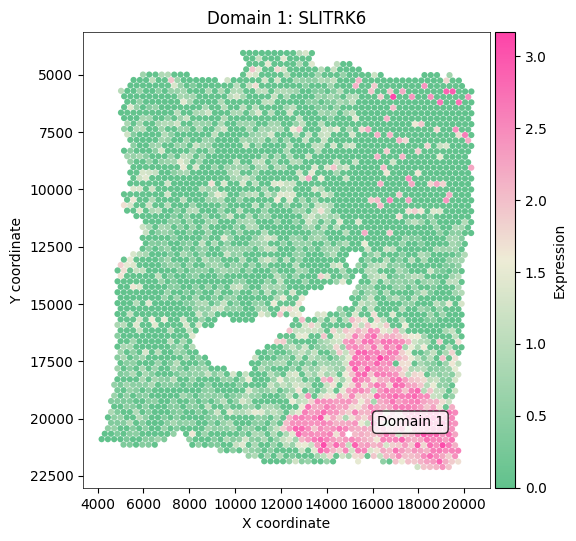

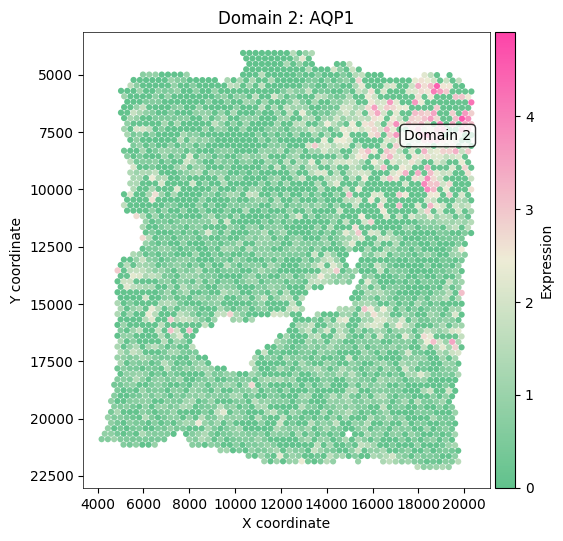

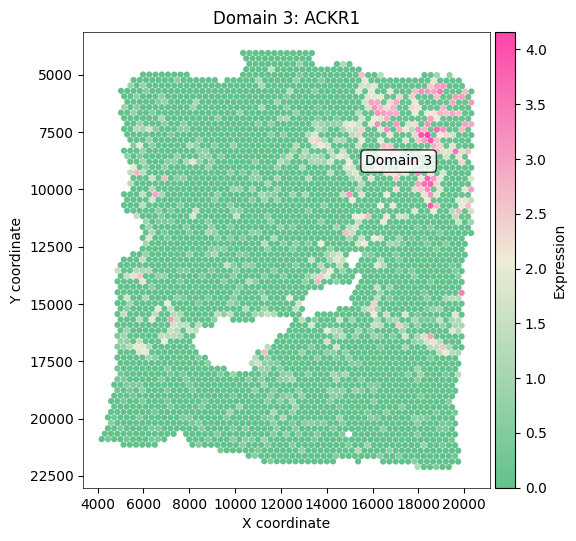

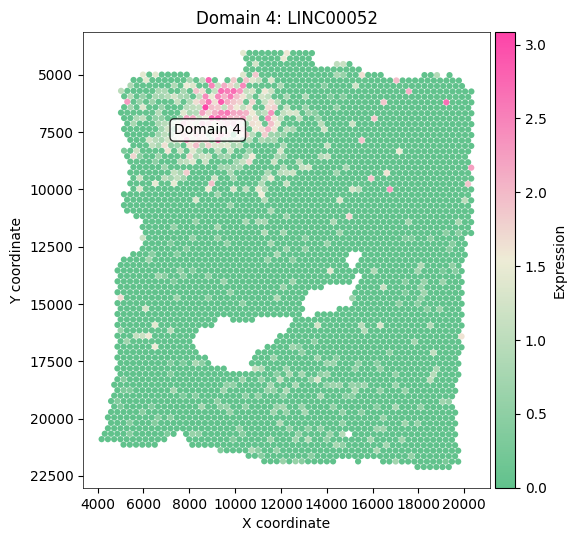

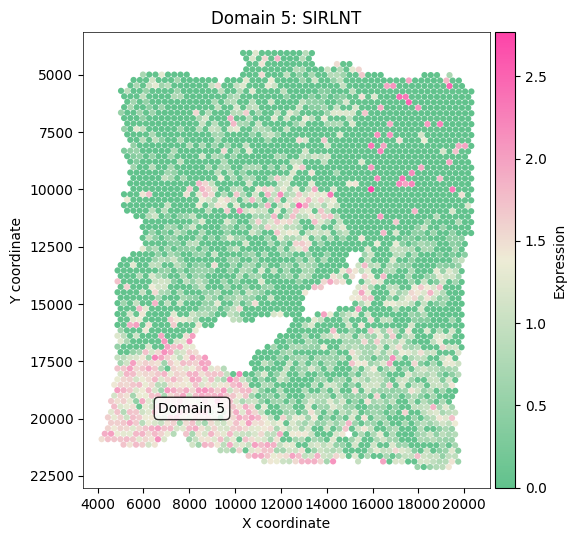

...

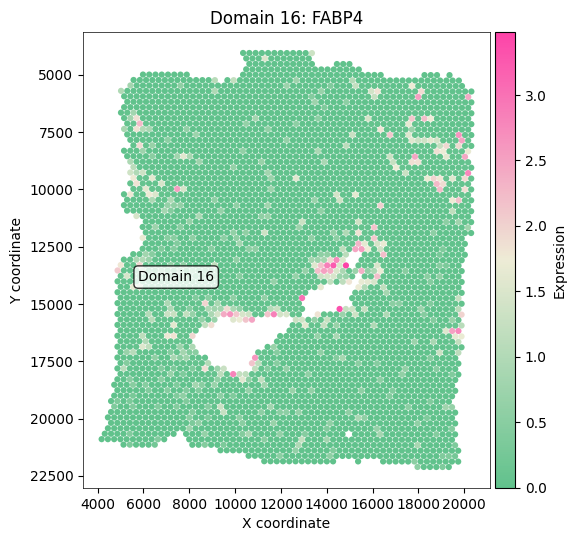

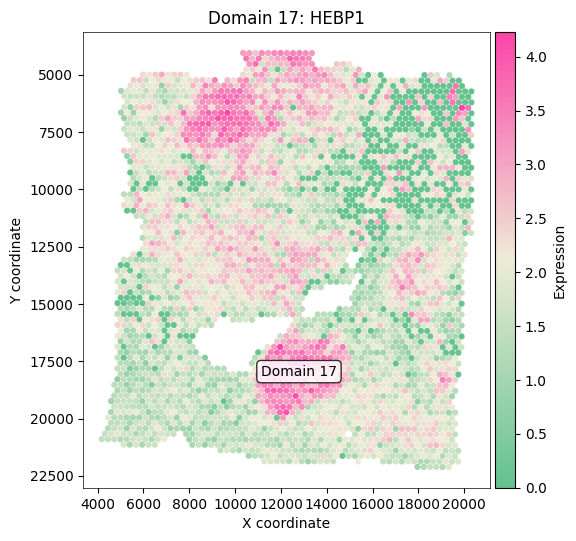

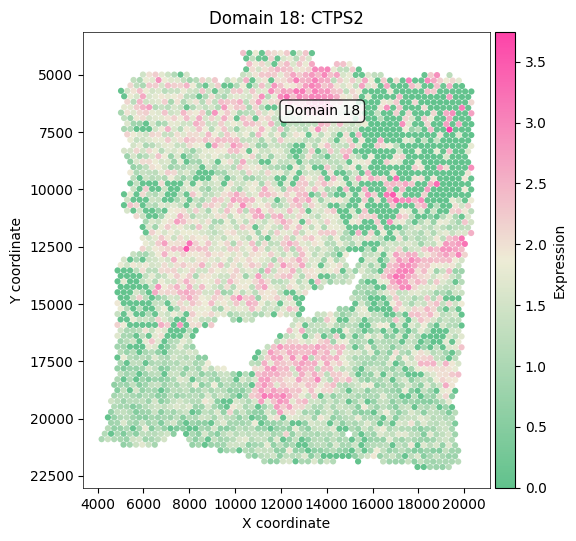

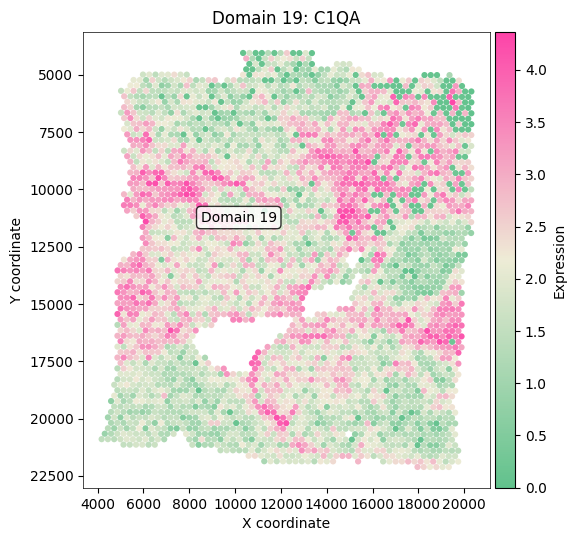

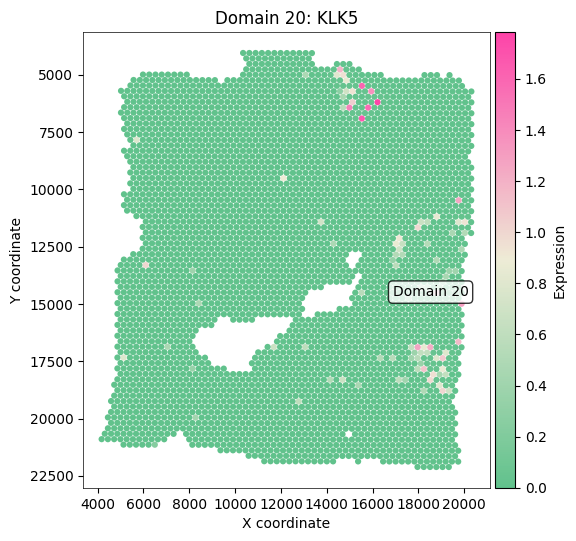

In [61]:


# Example usage
utils.plot_spatial_gene_expression(adata_processed, combined_all)


Saving gene clouds to: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC
Saved: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC/GeneCloud_Domain_1.png


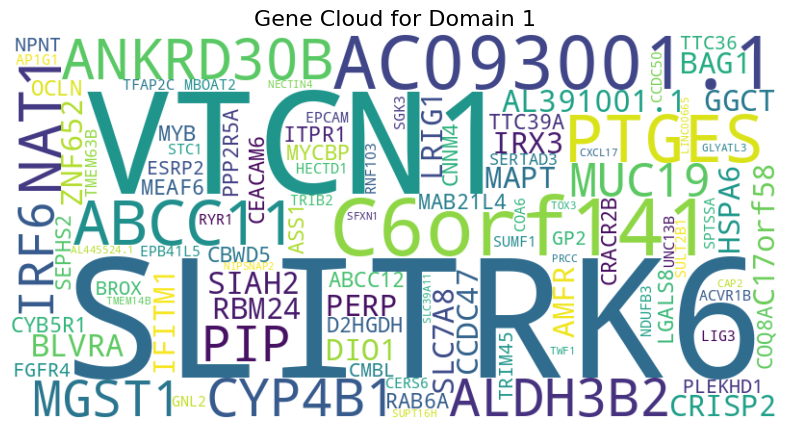

Saved: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC/GeneCloud_Domain_2.png


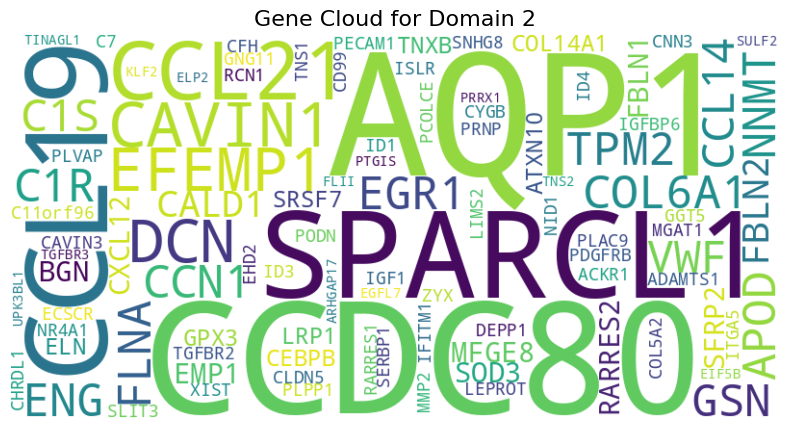

Saved: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC/GeneCloud_Domain_3.png


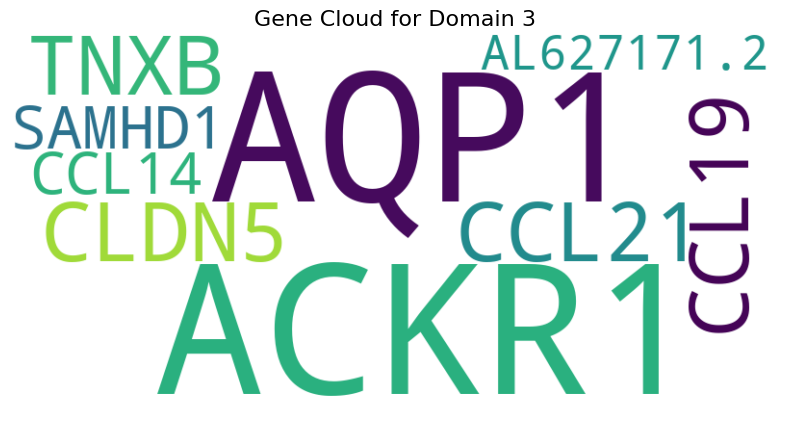

Saved: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC/GeneCloud_Domain_4.png


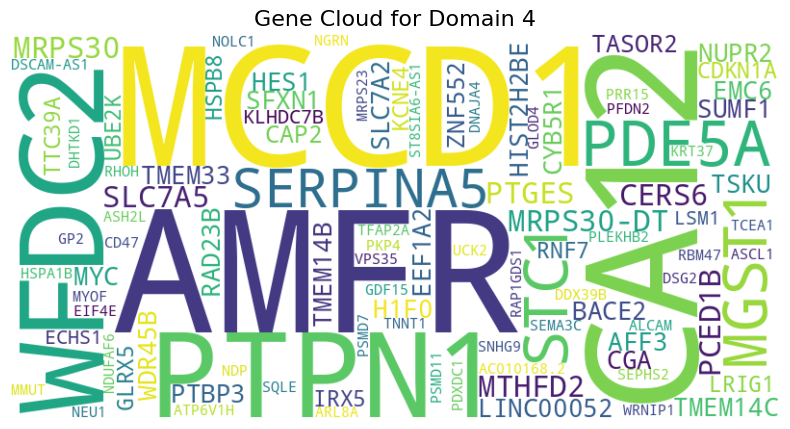

Saved: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC/GeneCloud_Domain_5.png


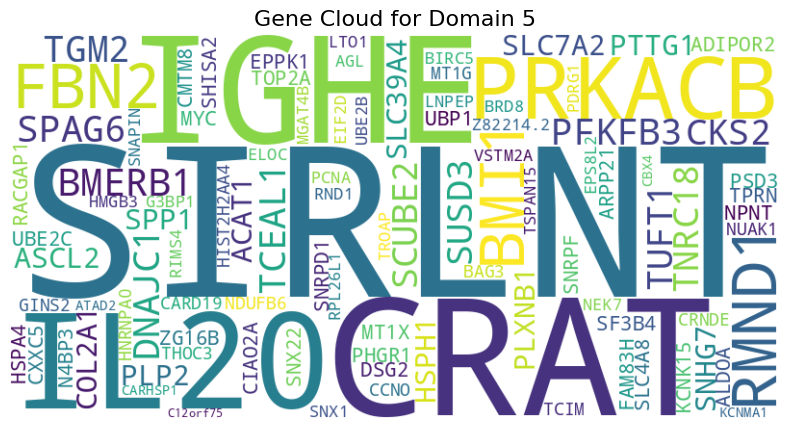

Saved: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC/GeneCloud_Domain_6.png


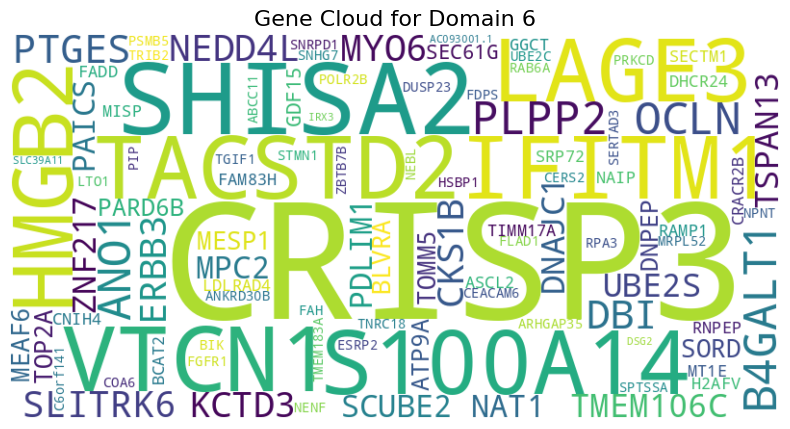

Saved: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC/GeneCloud_Domain_7.png


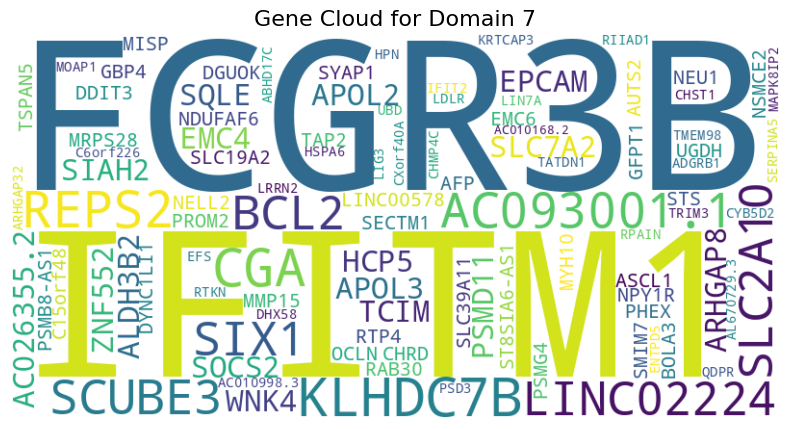

Saved: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC/GeneCloud_Domain_8.png


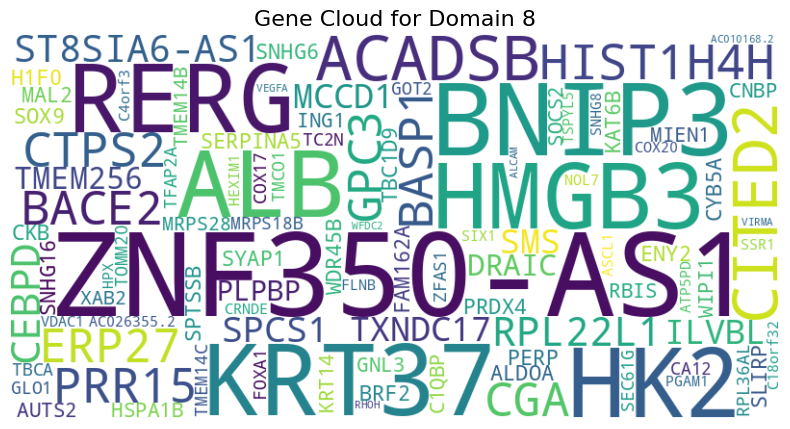

Saved: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC/GeneCloud_Domain_9.png


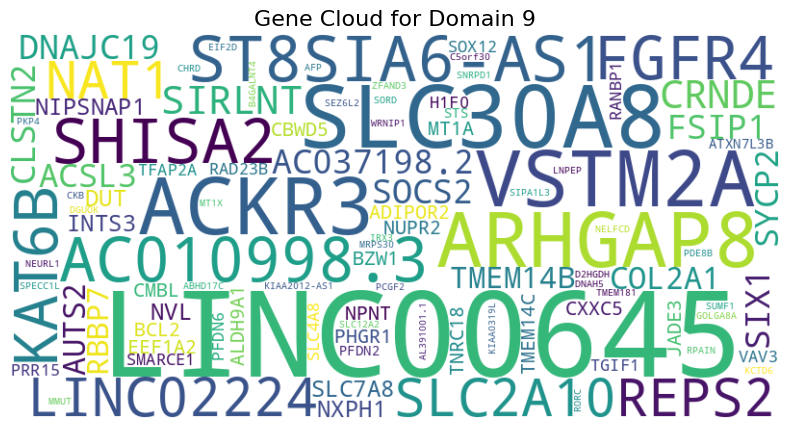

Saved: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC/GeneCloud_Domain_10.png


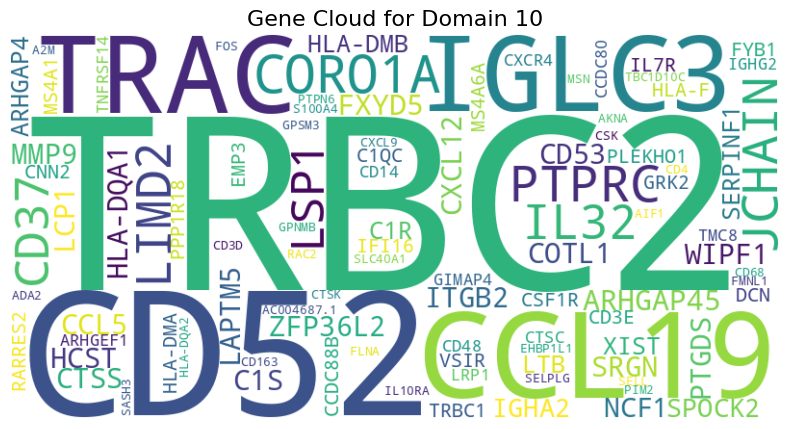

Saved: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC/GeneCloud_Domain_11.png


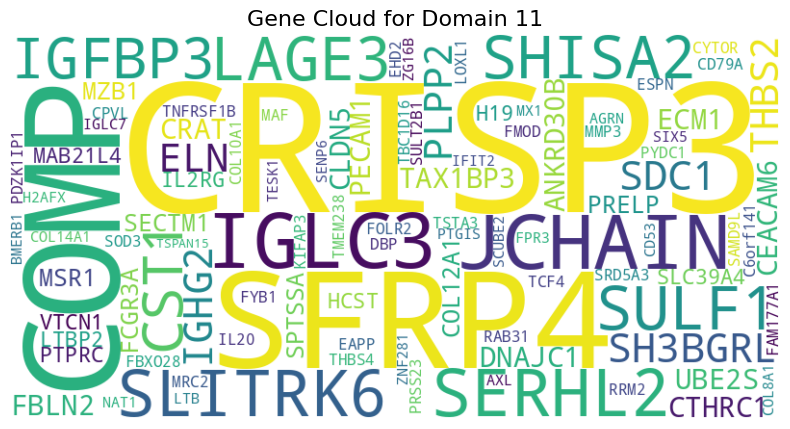

Saved: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC/GeneCloud_Domain_12.png


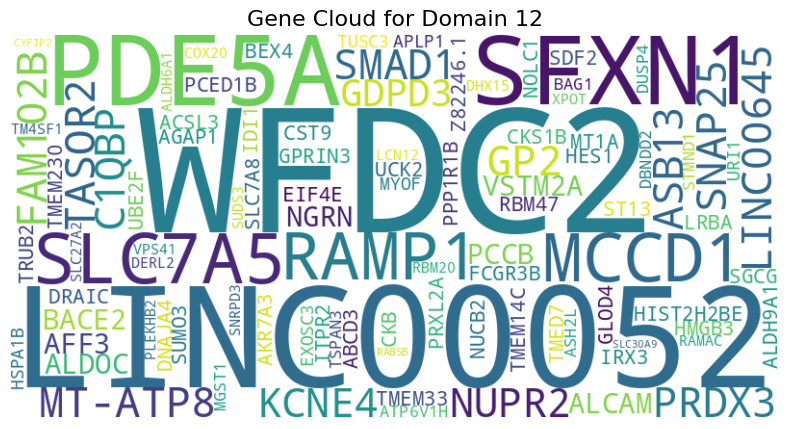

Saved: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC/GeneCloud_Domain_13.png


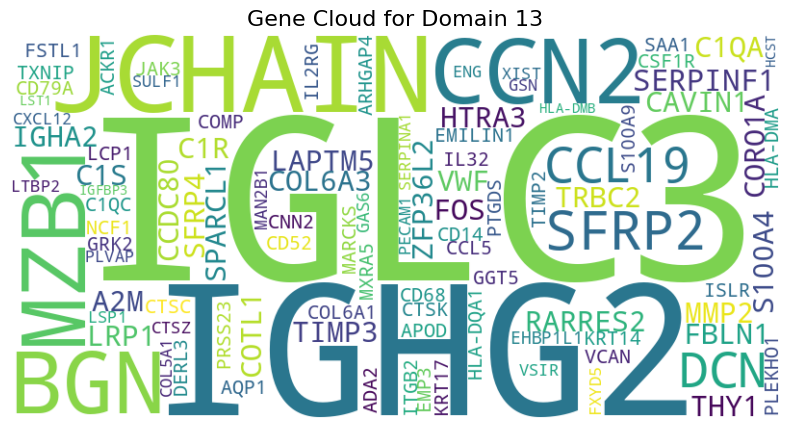

Saved: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC/GeneCloud_Domain_14.png


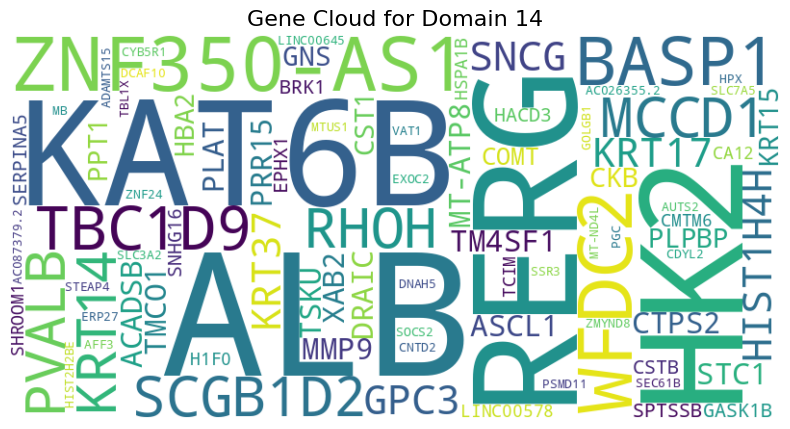

Saved: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC/GeneCloud_Domain_15.png


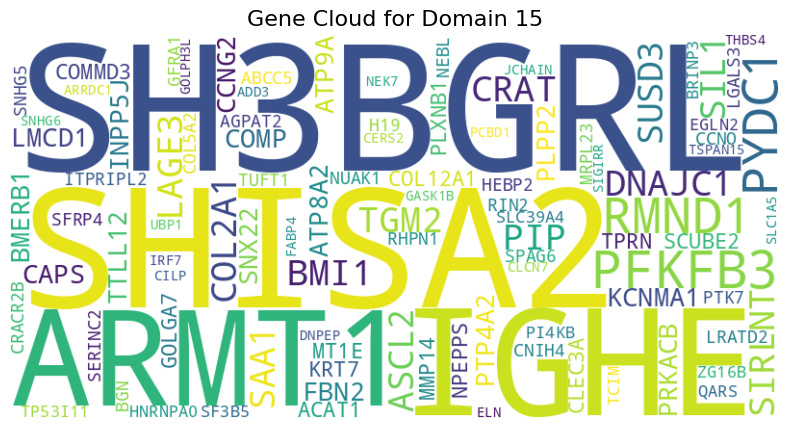

Saved: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC/GeneCloud_Domain_16.png


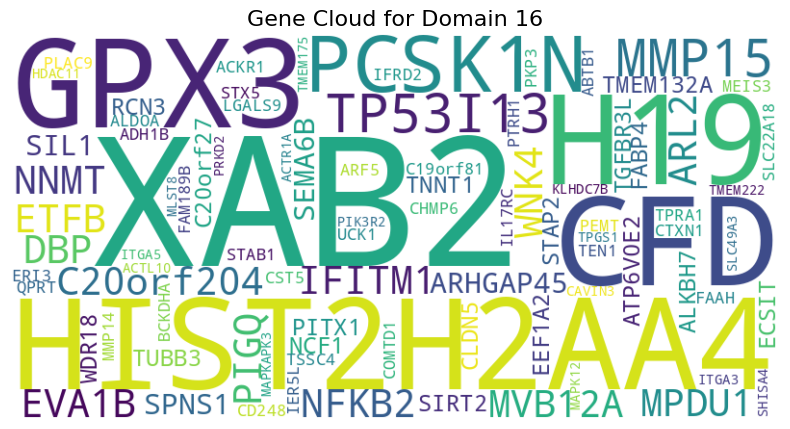

Saved: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC/GeneCloud_Domain_17.png


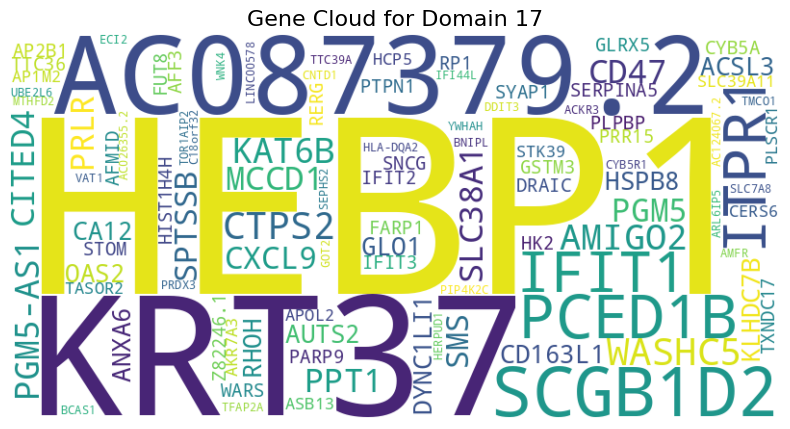

Saved: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC/GeneCloud_Domain_18.png


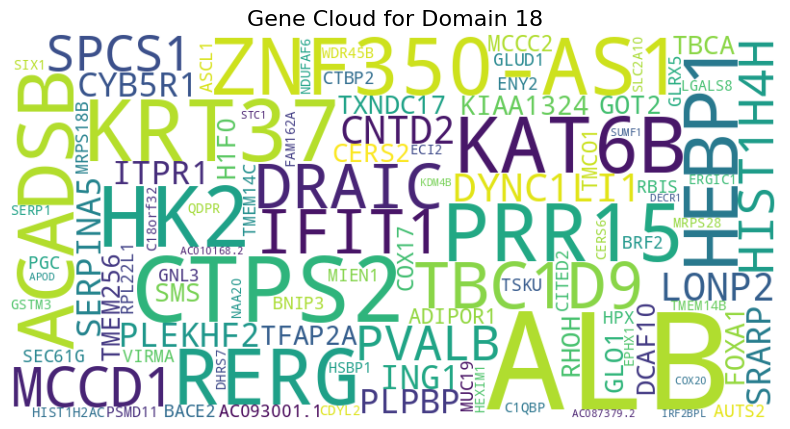

Saved: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC/GeneCloud_Domain_19.png


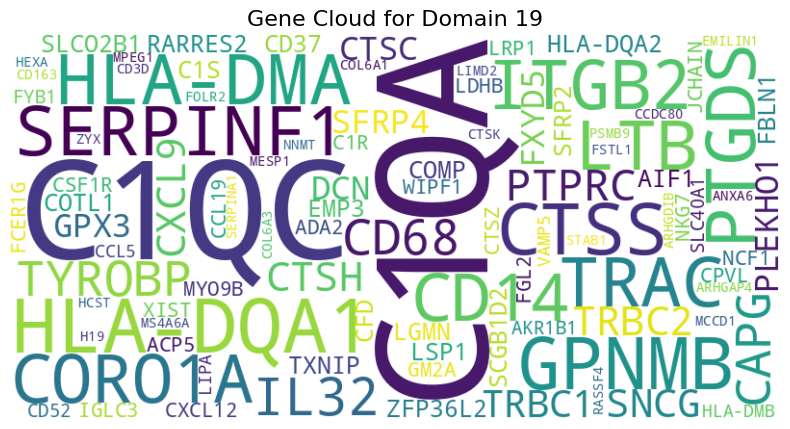

Saved: /data4/hussin/hussain/tryingGithub/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC/GeneCloud_Domain_20.png


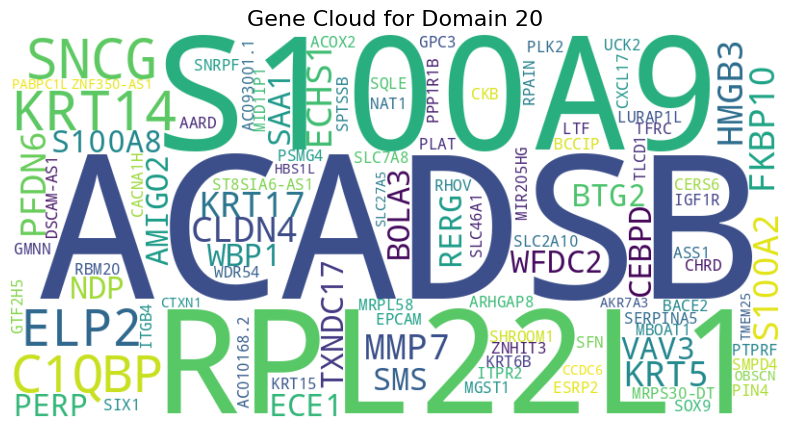

✅ All gene clouds saved and displayed successfully!


In [ ]:


output_dir = "/data4/hussin/hussain/data/BRCA1/V1_Human_Breast_Cancer_Block_A_Section_1/results/GC"

# Show and save all clouds
utils.generate_gene_clouds(combined_all, output_dir, show=True)


In [63]:
def integration_one_two_adj_genes():
    rst = np.array([])
    for item in spatial_markers_1:
        rst = np.append(rst, item['genes'].values)

    for item in spatial_markers_2:
        rst = np.append(rst, item['genes'].values)

    return rst

In [64]:
integration_genes_array = integration_one_two_adj_genes()

In [ ]:
#!pip install squidpy

In [65]:
import squidpy as sq
from squidpy import gr, im, pl, read, datasets

integration_genes_array = np.unique(integration_genes_array)
len(integration_genes_array)
pd.Index(integration_genes_array)

Index(['A1BG', 'A2M', 'AACS', 'AAGAB', 'AAK1', 'AARD', 'AARS', 'AARSD1',
       'AASDHPPT', 'ABAT',
       ...
       'ZNHIT1', 'ZNHIT3', 'ZNRD2', 'ZNRF1', 'ZNRF2', 'ZSCAN16-AS1', 'ZSCAN9',
       'ZWINT', 'ZXDC', 'ZYX'],
      dtype='object', length=5082)

In [66]:
len(integration_genes_array)

5082

In [67]:
sq.gr.spatial_neighbors(adata_processed, coord_type="generic", delaunay=True)
sq.gr.spatial_autocorr(adata_processed, genes=pd.Index(integration_genes_array), use_raw=False, mode="moran")
adata_processed.uns["moranI"].head(10)

,I,pval_norm,var_norm,pval_norm_fdr_bh
CRISP3,0.692128,0.0,0.000088,0.0
ALB,0.633379,0.0,0.000088,0.0
SLITRK6,0.618774,0.0,0.000088,0.0
LINC00645,0.595287,0.0,0.000088,0.0
IGLC3,0.539423,0.0,0.000088,0.0
ARPP21,0.526491,0.0,0.000088,0.0
LINC00052,0.515295,0.0,0.000088,0.0
KRT14,0.507586,0.0,0.000088,0.0
HEBP1,0.507395,0.0,0.000088,0.0
AC087379.2,0.506695,0.0,0.000088,0.0


In [68]:
import squidpy as sq

# Compute spatial neighbors (if not already done)
sq.gr.spatial_neighbors(adata_processed, coord_type="generic", delaunay=True)

# Calculate Moran's I for selected genes
sq.gr.spatial_autocorr(
    adata_processed, 
    genes=pd.Index(integration_genes_array), 
    use_raw=False, 
    mode="moran"  # Mode for Moran's I
)

# View top 10 genes by Moran's I
moran_results = adata_processed.uns["moranI"].head(50)
print("Moran's I Top 10 Genes:")
print(moran_results)

Moran's I Top 10 Genes:
                   I  pval_norm  var_norm  pval_norm_fdr_bh
CRISP3      0.692128        0.0  0.000088               0.0
ALB         0.633379        0.0  0.000088               0.0
SLITRK6     0.618774        0.0  0.000088               0.0
LINC00645   0.595287        0.0  0.000088               0.0
IGLC3       0.539423        0.0  0.000088               0.0
ARPP21      0.526491        0.0  0.000088               0.0
LINC00052   0.515295        0.0  0.000088               0.0
KRT14       0.507586        0.0  0.000088               0.0
HEBP1       0.507395        0.0  0.000088               0.0
AC087379.2  0.506695        0.0  0.000088               0.0
SCGB1D2     0.505029        0.0  0.000088               0.0
C6orf141    0.496939        0.0  0.000088               0.0
C1QA        0.492409        0.0  0.000088               0.0
KRT17       0.482893        0.0  0.000088               0.0
KRT37       0.481565        0.0  0.000088               0.0
KRT5        0.47

In [69]:
# Calculate Geary's C for the same genes
sq.gr.spatial_autocorr(
    adata_processed, 
    genes=pd.Index(integration_genes_array), 
    use_raw=False, 
    mode="geary"  # Mode for Geary's C
)

# View top 10 genes by Geary's C
geary_results = adata_processed.uns["gearyC"].head(50)
print("\nGeary's C Top 10 Genes:")
print(geary_results)


Geary's C Top 10 Genes:
                   C  pval_norm  var_norm  pval_norm_fdr_bh
CRISP3      0.307564        0.0  0.000088               0.0
ALB         0.365745        0.0  0.000088               0.0
SLITRK6     0.381179        0.0  0.000088               0.0
LINC00645   0.404375        0.0  0.000088               0.0
IGLC3       0.461486        0.0  0.000088               0.0
ARPP21      0.469709        0.0  0.000088               0.0
LINC00052   0.483777        0.0  0.000088               0.0
KRT14       0.492448        0.0  0.000088               0.0
HEBP1       0.493349        0.0  0.000088               0.0
AC087379.2  0.493431        0.0  0.000088               0.0
SCGB1D2     0.495505        0.0  0.000088               0.0
C6orf141    0.503598        0.0  0.000088               0.0
C1QA        0.508538        0.0  0.000088               0.0
KRT17       0.516325        0.0  0.000088               0.0
KRT37       0.518303        0.0  0.000088               0.0
KRT5        0.5

In [70]:
import pandas as pd

# Get top 50 genes by absolute Moran's I (highest spatial autocorrelation)
top_moran = (
    adata_processed.uns["moranI"]
    .sort_values(by="I", key=abs, ascending=False)
    .head(50)
)

# Get top 50 genes by Geary's C (lowest values indicate stronger autocorrelation)
top_geary = (
    adata_processed.uns["gearyC"]
    .sort_values(by="C", ascending=True)  # Geary's C: Lower = more autocorrelation
    .head(50)
)